##### AJUSTA T1 PRA TAMANHO DO FLAIR

In [ ]:
import nibabel as nib
import numpy as np
from scipy.ndimage import zoom

flair_path = 'Displasia/sub-00003/anat/sub-00003_acq-T2sel_FLAIR.nii.gz'
t1_path = 'Displasia/sub-00003/anat/sub-00003_acq-iso08_T1w.nii.gz' 
output_path = 't1_reduzido.nii.gz' # Caminho onde quer salvar

# Paths das imagens
flair_img = nib.load(flair_path)
t1_img = nib.load(t1_path)

# Data das imagens
flair_data = flair_img.get_fdata()
t1_data = t1_img.get_fdata()

# Shape das imagens
flair_shape = flair_data.shape
t1_shape = t1_data.shape

# Calcular o fator de escala para redimensionar a imagem T1 para o tamanho da imagem FLAIR
scaling_factor = np.array(flair_shape) / np.array(t1_shape)

# Redimensionar a imagem T1 para as dimensões da imagem FLAIR usando interpolação trilinear
t1_rescaled = zoom(t1_data, scaling_factor, order=1)

# Salvar a imagem T1 escalada
t1_rescaled_img = nib.Nifti1Image(t1_rescaled, t1_img.affine)
nib.save(t1_rescaled_img, output_path) # Implementar lógica para salvar a imagem redimensionada e já usá-la na próxima célula

##### VISUALIZAÇÃO DE IMAGENS (3D)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from nilearn.image import load_img
import os

# "/mnt/c/Team Taiane/Desktop/ADNI/FULL_ADNI/raw_data/NIFTI_RAW/train/mci/I8603.nii.gz"
# 
img_path = "/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/to_process/NIFTI_PROCESSED/train/cn/I20075.nii.gz"

# Definir as coordenadas de corte
x_slices = [82]  # Sagital
y_slices = [91]  # Coronal
z_slices = [88]  # Axial

# Carregar a imagem do cérebro
img_brain = load_img(img_path)

# Obter os dados das imagens como arrays numpy
brain_data = img_brain.get_fdata()

print(f"{os.path.basename(img_path)} - shape: {brain_data.shape}")

# Criar a figura para plotagem (1 linha e 3 colunas)
fig, axes = plt.subplots(1, 3, figsize=(16, 5))  

# Ajuste de espaçamento entre colunas
plt.subplots_adjust(wspace=0.3)  # <-- Aumenta o espaço entre imagens

# Tamanho da fonte dos títulos
title_fontsize = 20

# Ajuste de altura e largura para a fatia sagital
height_factor = 1.2  # Aumenta altura
width_factor = 1.5   # Reduzi um pouco para evitar distorção

# Plotar a fatia sagital (x)
brain_sagittal = brain_data[x_slices[0], :, :]
h, w = brain_sagittal.shape
axes[0].imshow(brain_sagittal.T, cmap="gray", origin="lower", extent=[0, w * width_factor, 0, h * height_factor])
axes[0].set_title(f"Sagital (x={x_slices[0]})", fontsize=title_fontsize)
axes[0].axis("off")  

# Plotar a fatia coronal (y)
brain_coronal = brain_data[:, y_slices[0], :]
axes[1].imshow(brain_coronal.T, cmap="gray", origin="lower")
axes[1].set_title(f"Coronal (y={y_slices[0]})", fontsize=title_fontsize)
axes[1].axis("off")  

# Plotar a fatia axial (z)
brain_axial = brain_data[:, :, z_slices[0]]
axes[2].imshow(brain_axial.T, cmap="gray", origin="lower")
axes[2].set_title(f"Axial (z={z_slices[0]})", fontsize=title_fontsize)
axes[2].axis("off")  

# Ajustar layout para evitar sobreposição
plt.tight_layout()
plt.show()

##### PRINT SLICES

In [ ]:
import matplotlib.pyplot as plt
import nibabel as nib
import numpy as np

# Carregar a imagem
path_image = "/mnt/c/Users/Team Taiane/Desktop/ADNI/FULL_ADNI/raw_data/3D_BRAIN_NOT_NORMALIZED/validation/ad/I306067.nii.gz"
image_7 = nib.load(path_image).get_fdata()
print(image_7.shape)

# Fatias a serem exibidas
slices = [88]

if len(slices) > 1:
    # Criar a figura com 1 linha e 7 colunas
    fig, axes = plt.subplots(1, 7, figsize=(20, 5))

    # Iterar sobre as fatias e plotar as imagens
    for idx, slice_idx in enumerate(slices):
        ax = axes[idx]  # Seleciona o subplot correto
        rotated_slice = image_7[:, :, slice_idx]  # Obter a fatia correspondente
        ax.imshow(rotated_slice.T, cmap='gray', origin='lower')  # Exibir a fatia
        ax.set_title(f'Fatia axial {slice_idx}', fontsize=10)
        ax.axis('off')  # Remover os eixos

    # Ajustar layout
    plt.tight_layout()
    plt.show()
else:
    plt.imshow(np.rot90(image_7[:, :, slices[0]].T, k=1), cmap='gray', origin='lower')  # Exibir a fatia
    plt.title(f'Fatia axial {slices[0]}', fontsize=15)
    plt.axis('off')  # Remover os eixos

    # Ajustar layout
    plt.tight_layout()
    plt.show()

##### DOWNSAMPLING (DICOM)

In [ ]:
import os
import shutil
import random
from math import ceil, floor

def explore_folder(directory, string): # função para percorrer cada diretório e retornar todos os caminhos de .nii.gz
    paths =  []
    for item in os.listdir(directory):
        folder = os.path.join(directory, item, 'ADNI')
        for subject in os.listdir(folder):
            patient = os.path.join(folder, subject, string)
            for date in os.listdir(patient):
                exam = os.path.join(patient, date)
                for file in os.listdir(exam):
                    file_path = os.path.join(exam, file)
                    paths.append(file_path)
    return paths

base = 'MPRAGE'
classification = 'ad' 
directory = os.path.join(base, classification)

# pra guardar os endereços dos arquivos da classe
paths = []

# testar se há subpastas vazias
empty_subjects = 0 
empty_exams = 0

# enche o vetor
paths = explore_folder(directory, 'MPRAGE')

# print(paths)

print(f"Total de arquivos: {len(paths)}")
print(f"Total de exames vazias: {empty_exams}")
print(f"Total de pacientes vazias: {empty_subjects}")

total_paths = len(paths)

target_count = 735 # valor para o qual deseja-se reduzir o número de amostras

random.shuffle(paths) # embaralha vetor para fazer remoção sem viés

# remover até que a lista tenha target_count itens
while total_paths > target_count:
    path_to_remove = paths.pop()

    #shutil.rmtree(path_to_remove)  # Remove o diretório (com seus conteúdos)
    print(f"Pasta removida: {path_to_remove}")
    
    total_paths -= 1  # decrementa a quantidade de arquivos/pastas removidos

# agora, a lista de paths deve ter target_count itens restantes
print(f"Restando {len(paths)} arquivos/pastas.")

##### DIVISÃO ENTRE CONJUNTOS (DICOM)

In [ ]:
group = 'ad' # classe a ser dividida
cont = 0

# caminhos de cada conjunto
train_folder = os.path.join('conjuntos', 'train', group)
val_folder = os.path.join('conjuntos', 'validation', group)
test_folder = os.path.join('conjuntos', 'test', group)

# diretórios usados com os arquivos espalhados
mp_dir = os.path.join('MPRAGE', group)
sense_dir = os.path.join('SENSE2', group)

# vetores para armazenar os caminhos já divididos entre os conjuntos
train_paths = []
val_paths = []
test_paths = []

# retornar os caminhos para cada arquivo .nii.gz espalhado
mp_paths = explore_folder(mp_dir, 'MPRAGE')
sense_paths = explore_folder(sense_dir, 'MPRAGE_SENSE2')
full_paths = mp_paths + sense_paths

# calcular quantos arquivos vão pra cada conjunto
n = len(full_paths)
train = floor(n*0.7)
validation = floor(n*0.2)
test = floor(n*0.1)

print(f"full: {n}\ntrain (70): {train}\nvalidation (20): {validation}\ntest (10): {test}\nsoma: {train+validation+test}\n\n")

# enche cada vetor
for path in full_paths:
    if cont < train:
        cont += 1
        train_paths.append(path)
    elif cont < train+validation:
        cont += 1
        val_paths.append(path)
    else:
        test_paths.append(path)

print(f"train (70): {len(train_paths)}\nvalidation (20): {len(val_paths)}\ntest (10): {len(test_paths)}\nsoma: {len(train_paths)+len(val_paths)+len(test_paths)}\n\n")

# copia o item do endereço antigo para um novo
for item in train_paths:
    shutil.copytree(item, os.path.join(train_folder, os.path.basename(item)))
for item in val_paths:
    shutil.copytree(item, os.path.join(val_folder, os.path.basename(item)))
for item in test_paths:
    shutil.copytree(item, os.path.join(test_folder, os.path.basename(item)))

##### CROPPAR IMAGENS (NIFTI)

In [ ]:
import os
import nibabel as nib
import matplotlib.pyplot as plt

# índices de corte para o corte NIfTI
SLICE_NII_IDX0 = slice(24, 169)
SLICE_NII_IDX1 = slice(24, 206)
SLICE_NII_IDX2 = slice(6, 161)

base = 'train'
dir = 'ad'

for subset in os.listdir(base):
    dir = os.path.join(base, subset) # salva junção do conjunto com a pasta referente à classe
    for name in os.listdir(dir):
        file = os.path.join(dir, name) # acessa cada arquivo dentro da pasta
        image = nib.load(file)
        data = image.get_fdata()

        print(f"shape da imagem {name} original: {data.shape}")
        data_cropped = data[SLICE_NII_IDX0, SLICE_NII_IDX1, SLICE_NII_IDX2] # corta a imagem para o tamanho desejadao
        print(f"shape da imagem {name} cortada: {data_cropped.shape}\n\n")

        # criar um novo objeto NIfTI com o corte
        nifti_cropped = nib.Nifti1Image(data_cropped, image.affine, image.header)
        
        # salvar no mesmo arquivo (sobrescrevendo)
        nib.save(nifti_cropped, file)

##### PEGAR SLICES DO VOLUME 3D

In [ ]:
import os
import ants
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ThreadPoolExecutor

def winsorize_image(image_data, lower_percentile=1, upper_percentile=99): #reduz valores extremos
    lower_bound = np.percentile(image_data, lower_percentile)
    upper_bound = np.percentile(image_data, upper_percentile)
    winsorized_data = np.clip(image_data, lower_bound, upper_bound)
    return winsorized_data

# Normalization -> valores de voxels entre 0 e 1
def normalize_image_min(image_data): 
    min_val = np.min(image_data)
    max_val = np.max(image_data)
    normalized_data = (image_data - min_val) / (max_val - min_val)
    return normalized_data

def reshape_img(input_folder, output_folder, item, slice_idx, axis):
    input_path = os.path.join(input_folder, item)
    #print(f"IMAGEM {input_path} SENDO REDIMENSIONADA.")
    output_path = os.path.join(output_folder, item)

    img_3d = ants.image_read(input_path)
    data_2d = img_3d.numpy()

    if axis == 0: #sagital -> x
        data_2d = data_2d[slice_idx, :, :]
    elif axis == 1: # coronal -> y
        data_2d = data_2d[:, slice_idx, :]
    elif axis == 2: # sagital -> z
        data_2d = data_2d[:, :, slice_idx]
        
    data_2d = normalize_image_min(data_2d)
    img_2d = ants.from_numpy(data_2d)
    
    ants.image_write(img_2d, output_path)
    print(f"IMAGEM SALVA EM {output_path}\n")


DIR_BASE = "c:/Users/Paulo Pires/Desktop/Alzheimer_cnn/3D_BRAIN_NOT_NORMALIZED"
DIR_2D = "C:/Users/Paulo Pires/Desktop/Alzheimer_cnn/teste"

x_idx = 80 # sagital
y_idx = 73 # coronal
z_idx = 88 # axial

axis = 0 # eixo das fatias que pegaremos (0 para sagital, 1 para coronal e 2 para sagital)

#slice_idx = (80, 84, 88, 92, 96) # slices a serem salvos
slice_idx = (60, 68, 76, 82, 89, 92, 96) # slices a serem salvos (pode ser 1 ou mais de um),

for subfolder in ['test', 'train', 'validation']:
    print(f"\n\nDIRECTORY: {subfolder}\n\n")
    input_dir = os.path.join(DIR_BASE, subfolder)
    output_dir = os.path.join(DIR_2D, subfolder)
    os.makedirs(output_dir, exist_ok=True)

    for group in os.listdir(input_dir):
        print(f"GROUP: {group}\n\n")
        input_folder = os.path.join(input_dir, group)            
        output_folder = os.path.join(output_dir, group)       
        os.makedirs(output_folder, exist_ok=True)

        already_processed = [file for file in os.listdir(output_folder)] # checa se alguma já foi processada
        image_paths = [file for file in os.listdir(input_folder) if file not in already_processed] # carrega as imagens não processadas

        #for item in image_paths:
        #     reshape_img(input_folder, output_folder, item, slice_idx)

        with ThreadPoolExecutor(max_workers=8) as executor:
            futures = [executor.submit(reshape_img, input_folder, output_folder, item, slice_idx, axis) for item in image_paths]

            # Aguarda todas as tarefas terminarem
            for future in futures:
                future.result()

##### PLOT DATASET

In [64]:
from reportlab.pdfgen import canvas
from reportlab.lib.pagesizes import letter
from PIL import Image
import tempfile
import os
import numpy as np
import matplotlib.pyplot as plt
import nibabel as nib
from tqdm.auto import tqdm

def load_nifti_data(base_dir):
    images = []
    names = []

    files = os.listdir(base_dir)

    for fname in tqdm(files, desc=f"Carregando {os.path.basename(base_dir)}", total=len(files), miniters=1):
        img_path = os.path.join(base_dir, fname)
        img = nib.load(img_path).get_fdata()
        names.append(fname)
        images.append(img)

    return images, names

def load_nifti_image_pdf(file_path):
    img = nib.load(file_path)
    data = img.get_fdata() 
    slice_2d = data 
    return slice_2d

def save_images_to_pdf(images, names, output_pdf_path, idx):
    c = canvas.Canvas(output_pdf_path, pagesize=letter)
    width, height = letter 
    
    images_per_row = 3
    images_per_column = 5
    total_images_per_page = images_per_row * images_per_column
    margin = 40 
    scale_factor = 0.75 
    img_width = ((width - (images_per_row + 1) * margin) / images_per_row) * scale_factor
    img_height = ((height - (images_per_column + 1) * margin) / images_per_column) * scale_factor
    
    for i, (image, name) in enumerate(zip(images, names)):
        image = image[:, :, idx]
        if isinstance(image, np.ndarray):
            img = Image.fromarray(np.uint8(image / np.max(image) * 255))
        else:
            img = image 
        
        img = img.convert("RGB")
        img = img.resize((int(img_width), int(img_height)))

        with tempfile.NamedTemporaryFile(delete=False, suffix=".png") as temp_file:
            temp_file_path = temp_file.name
            img.save(temp_file_path)

        row = (i % total_images_per_page) // images_per_row
        col = (i % total_images_per_page) % images_per_row
        x = margin + col * (img_width + margin)
        y = height - margin - (row + 1) * (img_height + margin + 15) 
        
        c.setFont("Helvetica", 10)
        c.setFillColorRGB(0, 0, 0)
        c.drawString(x + 5, y + img_height + 5, name) 
        c.drawImage(temp_file_path, x, y, width=img_width, height=img_height)

        if (i + 1) % total_images_per_page == 0:
            c.showPage()
    
    c.save()
    os.remove(temp_file_path)

subset = ['train', 'validation', 'test']
labels = ['cn', 'emci', 'mci', 'lmci', 'ad']

shap = (193, 229, 193)

base_dir = "/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED"
# base_dir = "/mnt/c/Users/Team Taiane/Desktop/ADNI/FULL_ADNI"

pdf_base = f"{base_dir}/data_plots"
# os.makedirs(pdf_base, exist_ok=True)

In [65]:
images, names = [], []

sub = subset[0]

for sub in ['test', 'validation', 'train']:
    dir_sub = f"{base_dir}/{sub}"
    for label in labels:
        print(f"\n\nDADOS DE {sub}_{label}\n\n") 
        dir = f"{dir_sub}/{label}"
        images, names = load_nifti_data(dir)

        pdf_path = f"{pdf_base}/{sub}"
        os.makedirs(pdf_path, exist_ok=True)
        pdf_path = f"{pdf_path}/data_{sub}_{label}.pdf"

        save_images_to_pdf(images, names, pdf_path, 85)

        images, names = [], []

        print(f"{pdf_path} pronto!")



DADOS DE test_cn




Carregando cn: 100%|██████████| 73/73 [00:27<00:00,  2.62it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/test/data_test_cn.pdf pronto!


DADOS DE test_emci




Carregando emci: 100%|██████████| 70/70 [00:25<00:00,  2.77it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/test/data_test_emci.pdf pronto!


DADOS DE test_mci




Carregando mci: 100%|██████████| 77/77 [00:28<00:00,  2.70it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/test/data_test_mci.pdf pronto!


DADOS DE test_lmci




Carregando lmci: 100%|██████████| 75/75 [00:27<00:00,  2.69it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/test/data_test_lmci.pdf pronto!


DADOS DE test_ad




Carregando ad: 100%|██████████| 77/77 [00:28<00:00,  2.66it/s]
/tmp/ipykernel_13806/522209673.py:46: RuntimeWarning: invalid value encountered in divide
  img = Image.fromarray(np.uint8(image / np.max(image) * 255))
/tmp/ipykernel_13806/522209673.py:46: RuntimeWarning: invalid value encountered in cast
  img = Image.fromarray(np.uint8(image / np.max(image) * 255))


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/test/data_test_ad.pdf pronto!


DADOS DE validation_cn




Carregando cn: 100%|██████████| 137/137 [00:53<00:00,  2.58it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/validation/data_validation_cn.pdf pronto!


DADOS DE validation_emci




Carregando emci: 100%|██████████| 130/130 [00:49<00:00,  2.65it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/validation/data_validation_emci.pdf pronto!


DADOS DE validation_mci




Carregando mci: 100%|██████████| 153/153 [00:56<00:00,  2.73it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/validation/data_validation_mci.pdf pronto!


DADOS DE validation_lmci




Carregando lmci: 100%|██████████| 147/147 [00:56<00:00,  2.61it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/validation/data_validation_lmci.pdf pronto!


DADOS DE validation_ad




Carregando ad: 100%|██████████| 152/152 [01:00<00:00,  2.52it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/validation/data_validation_ad.pdf pronto!


DADOS DE train_cn




Carregando cn: 100%|██████████| 530/530 [03:20<00:00,  2.64it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/train/data_train_cn.pdf pronto!


DADOS DE train_emci




Carregando emci: 100%|██████████| 523/523 [03:14<00:00,  2.69it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/train/data_train_emci.pdf pronto!


DADOS DE train_mci




Carregando mci: 100%|██████████| 535/535 [03:24<00:00,  2.62it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/train/data_train_mci.pdf pronto!


DADOS DE train_lmci




Carregando lmci: 100%|██████████| 526/526 [03:16<00:00,  2.68it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/train/data_train_lmci.pdf pronto!


DADOS DE train_ad




Carregando ad: 100%|██████████| 534/534 [03:27<00:00,  2.57it/s]


/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/data_plots/train/data_train_ad.pdf pronto!


In [ ]:
ble = nib.load("/mnt/c/Users/Team Taiane/Desktop/ADNI/codes/testing/affine_single/ad/I379681.nii.gz").get_fdata()

for i in range(0, ble.shape[2], 5):
    plt.imshow(ble[:, :, i], cmap='gray')
    plt.show()

In [ ]:
dir_affine = f"/mnt/c/Users/Team Taiane/Desktop/ADNI/codes/testing/affine_single"
dir_raw = f"/mnt/c/Users/Team Taiane/Desktop/ADNI/codes/testing/raw"
dir_syn = f"/mnt/c/Users/Team Taiane/Desktop/ADNI/codes/testing/syn_multi"

images, names = [], []

for label in ['cn', 'ad']:
    print(f"\n\nDADOS DE {os.path.basename(dir_syn)}_{label}\n\n") 
    dir = f"{dir_syn}/{label}"
    images, names = load_nifti_data(dir)

    pdf_path = f"{pdf_base}/{os.path.basename(dir_syn)}"
    os.makedirs(pdf_path, exist_ok=True)
    pdf_path = f"{pdf_path}/data_{os.path.basename(dir_syn)}_{label}.pdf"

    save_images_to_pdf(images, names, pdf_path, 100)

    images, names = [], []

    print(f"{pdf_path} pronto!")

In [ ]:
# path_analysis_pro = "/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/train/mci/I115719.nii.gz"
# path_analysis_pre = "/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_RAW/train/mci/I115719.nii.gz"
# path_analysis_syn = "/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/3D_BRAIN_NORM/train/mci/I115719.nii.gz"

path_analysis_affine = f"/mnt/c/Users/Team Taiane/Desktop/ADNI/codes/testing/affine_single/ad/I228875.nii.gz"
path_analysis_raw = f"/mnt/c/Users/Team Taiane/Desktop/ADNI/codes/testing/raw/ad/I228875.nii.gz"
path_analysis_syn = f"/mnt/c/Users/Team Taiane/Desktop/ADNI/codes/testing/syn_multi/ad/I228875.nii.gz"

img_pre = nib.load(path_analysis_raw).get_fdata()
img_pro = nib.load(path_analysis_affine).get_fdata()
img_syn = nib.load(path_analysis_syn).get_fdata()

In [ ]:
for i in range(80, 120, 5):
    figure, axs = plt.subplots(1, 3)

    axs[0].imshow(img_pre[:, :, i + 70], cmap='gray')
    axs[0].set_title(f"mri cru\n{img_pre.shape}", fontsize=9)
    axs[0].set_axis_off()

    axs[1].imshow(img_pro[:, :, i + 15], cmap='gray')
    axs[1].set_title(f"affine (novo) \n{img_pro.shape}", fontsize=9)
    axs[1].set_axis_off()

    axs[2].imshow(img_syn[:, :, i + 7], cmap='gray')
    axs[2].set_title(f"syn (antigo) \n{img_syn.shape}", fontsize=9)
    axs[2].set_axis_off()

    plt.show()

In [ ]:
# testar várias imagens

dir_affine = f"/mnt/c/Users/Team Taiane/Desktop/ADNI/codes/testing/affine_single"
dir_raw = f"/mnt/c/Users/Team Taiane/Desktop/ADNI/codes/testing/raw"
dir_syn = f"/mnt/c/Users/Team Taiane/Desktop/ADNI/codes/testing/syn_multi"

names = [f"cn/{item}" for item in os.listdir(f"{dir_affine}/cn")] + [f"ad/{item}" for item in os.listdir(f"{dir_affine}/ad")] 

In [ ]:
jo = 37
img_receba = nib.load(f"{dir_affine}/{names[jo]}").get_fdata()
    

figure, axs = plt.subplots(1, 3)

axs[0].imshow(np.rot90(img_receba[90, :, :], k=1), cmap='gray')
axs[0].set_title(f"{names[jo]}\naffine sagital \n{img_receba.shape}", fontsize=9)
axs[0].set_axis_off()

axs[1].imshow(np.rot90(img_receba[:, :, 94], k=1), cmap='gray')
axs[1].set_title(f"{names[jo]}\naffine axial \n{img_receba.shape}", fontsize=9)
axs[1].set_axis_off()

axs[2].imshow(np.rot90(img_receba[:, 100, :], k=1), cmap='gray')
axs[2].set_title(f"{names[jo]}\naffine coronal \n{img_receba.shape}", fontsize=9)
axs[2].set_axis_off()

plt.show()


In [ ]:
def metricas_imagem(data): #print metricas de uma imagem (max, min, media)
    if len(data.shape) > 1:
        values = data.flatten()

    print(f"MEDIA: {np.mean(values)}")
    print(f"MIN: {np.min(values)}")
    print(f"MAX: {np.max(values)}")

    plt.hist(values)
    plt.show()

def winsorize_image(image_data, lower_percentile=0, upper_percentile=99.8): #reduz valores extremos
    lower_bound = np.percentile(image_data, lower_percentile)
    upper_bound = np.percentile(image_data, upper_percentile)
    winsorized_data = np.clip(image_data, lower_bound, upper_bound)
    return winsorized_data

for index in [0, 1, 90, 95]:
    img_proaf = nib.load(f"{dir_affine}/{names[index]}").get_fdata()
    
    print("antes")
    metricas_imagem(img_proaf)
    plt.imshow(img_proaf[:, :, 90], cmap='gray')
    plt.show()

In [ ]:
for index in range(0, len(names)):
    img_pre = nib.load(f"{dir_raw}/{names[index]}").get_fdata()
    img_proaf = nib.load(f"{dir_affine}/{names[index]}").get_fdata()
    img_proasyn = nib.load(f"{dir_syn}/{names[index]}").get_fdata()

    i = 80

    figure, axs = plt.subplots(1, 3)

    axs[0].imshow(img_pre[:, :, i + 70], cmap='gray')
    axs[0].set_title(f"mri cru\n{img_pre.shape}", fontsize=9)
    axs[0].set_axis_off()

    axs[1].imshow(img_proaf[:, :, i + 15], cmap='gray')
    axs[1].set_title(f"affine (novo) \n{img_pro.shape}", fontsize=9)
    axs[1].set_axis_off()

    axs[2].imshow(img_proasyn[:, :, i + 12], cmap='gray')
    axs[2].set_title(f"syn (antigo) \n{img_syn.shape}", fontsize=9)
    axs[2].set_axis_off()

    plt.suptitle(f"PACIENTE {os.path.basename(names[index])}")
    plt.tight_layout(rect=[0, 0, 1, 1.4])
    plt.show()

### Descobrir maior fatia


In [3]:
import os
from tqdm import tqdm
import nibabel as nib
import numpy as np

def load_nifti_data(base_dir):
    images = []
    names = []
    affines = []

    files = os.listdir(base_dir)

    for fname in tqdm(files, desc=f"Carregando {os.path.basename(base_dir)}", total=len(files), miniters=1):
        img_path = os.path.join(base_dir, fname)
        img = nib.load(img_path)
        affines.append(img.affine)
        img = img.get_fdata()
        names.append(fname)
        images.append(img)

    return images, names, affines


testing_path = "/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/test"
testing_imgs, testing_names, testing_affines = [], [], []

In [4]:
for label in ['cn', 'emci', 'mci', 'lmci', 'ad']:
    testing_path_full = f"{testing_path}/{label}"
    imgs, nms, affs = load_nifti_data(testing_path_full)
    testing_imgs.extend(imgs)
    testing_names.extend(nms)
    testing_affines.extend(affs)
    imgs, nms = [], []

Carregando ad: 100%|██████████| 77/77 [00:25<00:00,  3.01it/s]


In [5]:
def encontrar_maior_fatia_single(img, eixo=2):
    non_black_pixels, idx_biggest, atual = 0, 0, 0

    for j in range(0, img.shape[eixo]):
        atual = np.count_nonzero(img[:, :, j])

        if (atual > non_black_pixels):
            non_black_pixels = atual
            idx_biggest = j

    return idx_biggest

def encontrar_maior_fatia_dir(testing_imgs, eixo=2):
    biggest_slices = [0 for z in range(0, testing_imgs[0].shape[eixo])]

    for bound_image in testing_imgs:
        idx_biggest = encontrar_maior_fatia_single(bound_image, 2)                
        biggest_slices[idx_biggest] += 1

    return biggest_slices

In [6]:
biggest_slices = encontrar_maior_fatia_dir(testing_imgs, 2)

bigbig = max(biggest_slices)
big_index = biggest_slices.index(bigbig)
print(f"maior fatia: {big_index} com {bigbig}")
print(biggest_slices)

maior fatia: 78 com 56
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 5, 12, 19, 38, 36, 56, 55, 55, 37, 19, 16, 13, 4, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]


### Encontrar índices para cortar

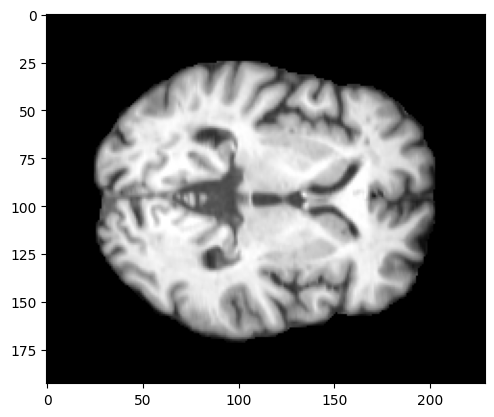

18 176 18 209


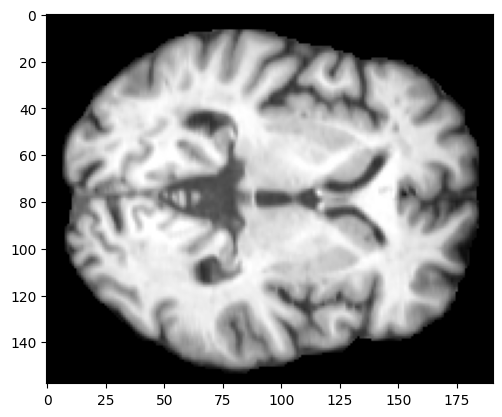

In [7]:
import os
from tqdm import tqdm
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt

test_sample = testing_imgs[0]

def encontrar_bordas_xy(data):
    min_x, max_x, min_y, max_y, min_z, max_z = 0, data.shape[0]-1, 0, data.shape[1]-1, 0, data.shape[2]-1
    while (np.count_nonzero(data[min_x, :, :])) == 0:
        min_x += 1
    min_x -= 5
    #print(min_x)

    while (np.count_nonzero(data[max_x, :, :])) == 0:
        max_x -= 1
    max_x += 5
    #print(max_x)

    while (np.count_nonzero(data[:, min_y, :])) == 0:
        min_y += 1
    min_y -= 5
    #print(min_y)

    while (np.count_nonzero(data[:, max_y, :])) == 0:
        max_y -= 1
    max_y += 5
    #print(max_y)

    while (np.count_nonzero(data[:, :, min_z])) == 0:
        min_z += 1
    min_z -= 5
    #print(max_y)

    while (np.count_nonzero(data[:, :, max_z])) == 0:
        max_z -= 1
    max_z += 5
    #print(max_y)

    return min_x, max_x, min_y, max_y, min_z, max_z

plt.imshow(testing_imgs[0][:, :, big_index], cmap='gray')
plt.show()

x1, x2, y1, y2, z1, z2 = encontrar_bordas_xy(testing_imgs[0])
print(x1,x2, y1, y2)

plt.imshow(testing_imgs[0][x1:x2, y1:y2, big_index], cmap='gray')
plt.show()

In [8]:
for cropping_image in testing_imgs:
    minx1, minx2, miny1, miny2, minz1, minz2 = 100, 100, 100, 100, 100, 100
    x1, x2, y1, y2, z1, z2 = encontrar_bordas_xy(cropping_image)

    minx1 = min(minx1, x1)
    minx2 = min(minx2, x2)
    miny1 = min(miny1, y1)
    miny2 = min(miny2, y2)
    minz1 = min(minz1, z1)
    minz2 = min(minz2, z2)

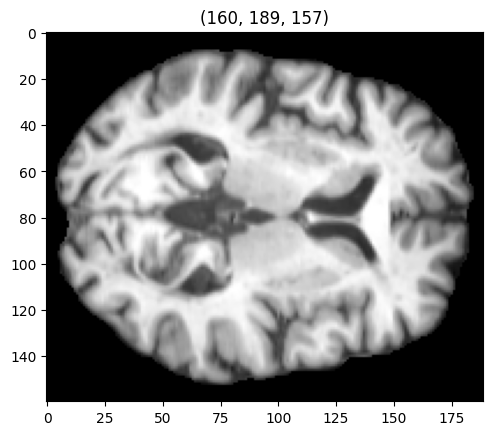

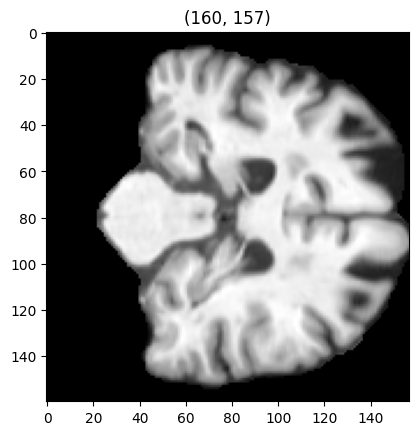

In [9]:
cropped_test_sample = test_sample[x1:x2, y1:y2, z1:z2]

plt.imshow(cropped_test_sample[:, :, big_index], cmap='gray')
plt.title(cropped_test_sample.shape)
plt.show()

plt.imshow(cropped_test_sample[:, 80, :], cmap='gray')
plt.title(cropped_test_sample[:, 80, :].shape)
plt.show()

In [13]:
for cropping_image, cropping_name, cropping_affine in zip(testing_imgs, testing_names, testing_affines):
    cropped_test_sample = cropping_image[x1:x2, y1:y2, z1:z2]

    nii_img = nib.Nifti1Image(cropped_test_sample, cropping_affine)

    # Salva como .nii.gz
    nib.save(nii_img, f"testing/{cropping_name}")
    
    # fig, axs = plt.subplots(1, 2)

    # big_index_act = encontrar_maior_fatia_single(cropping_image, 2)

    # axs[0].imshow(cropping_image[:, :, big_index_act], cmap='gray')
    # axs[0].set_title(cropping_image.shape)

    # axs[1].imshow(cropped_test_sample[:, :, big_index_act], cmap='gray')
    # axs[1].set_title(cropped_test_sample.shape)

    # plt.tight_layout(rect=[0, 0, 1, 1.3])
    # plt.suptitle(os.path.basename(cropping_name) + f" - fatia {big_index_act}")
    # plt.show()

In [ ]:
names_to_plot = os.listdir("/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/test/ad")
n_item = 0

for item in names_to_plot:
    if n_item < 50:
        img_cropped = nib.load(f"/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/test/ad/{item}").get_fdata()
        
        figure, axs = plt.subplots(1, 5)

        axs[0].imshow(img_cropped[:, :, 65], cmap='gray')
        axs[0].axis('off')
        axs[1].imshow(img_cropped[:, :, 75], cmap='gray')
        axs[1].axis('off')
        axs[2].imshow(img_cropped[:, :, 85], cmap='gray')
        axs[2].axis('off')
        axs[3].imshow(img_cropped[:, :, 95], cmap='gray')
        axs[3].axis('off')
        axs[4].imshow(img_cropped[:, :, 105], cmap='gray')
        axs[4].axis('off')

        plt.tight_layout(rect=[0, 0, 1, 1.6])
        plt.suptitle(item)
        plt.show()

In [ ]:
names_to_plot = os.listdir('testing')
n_item = 0

for item in names_to_plot:
    if n_item < 100:
        img_cropped = nib.load(f"testing/{item}").get_fdata()
        
        figure, axs = plt.subplots(1, 6)

        axs[0].imshow(img_cropped[:, :, 70], cmap='gray')
        axs[0].axis('off')
        axs[1].imshow(img_cropped[:, :, 75], cmap='gray')
        axs[1].axis('off')
        axs[2].imshow(img_cropped[:, :, 80], cmap='gray')
        axs[2].axis('off')
        axs[3].imshow(img_cropped[:, :, 85], cmap='gray')
        axs[3].axis('off')
        axs[4].imshow(img_cropped[:, :, 90], cmap='gray')
        axs[4].axis('off')
        axs[5].imshow(img_cropped[:, :, 95], cmap='gray')
        axs[5].axis('off')

        plt.tight_layout(rect=[0, 0, 1, 1.7])
        plt.suptitle(item)
        plt.show()
        n_item += 1

In [ ]:
subset = ['train', 'validation', 'test']
labels = ['cn', 'emci', 'mci', 'lmci', 'ad']

base_dir = "/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED"

for sub in subset:
    dir_sub = f"{base_dir}/{sub}"

    for label in labels:
        dir = f"{dir_sub}/{label}"
        names_to_change = os.listdir(dir)

        print(f"salvando no diretório {sub}/{label}")

        #for item in names_to_change:
        for item in names_to_change:
            file_path = f"{dir}/{item}"
            img_to_crop = nib.load(file_path)
            img_affine = img_to_crop.affine
            img_to_crop = img_to_crop.get_fdata()
            crop_img = img_to_crop[x1:x2, y1:y2, z1:z2]

            nii_img = nib.Nifti1Image(crop_img, img_affine)

            #nib.save(nii_img, file_path)

salvando no diretório train/cn
salvando no diretório train/emci


FileNotFoundError: No such file or no access: '/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED/train/emci/I100034.nii.gz'

salvando no diretório train/cn


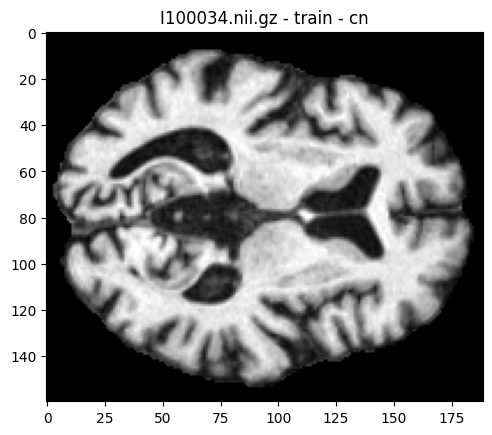

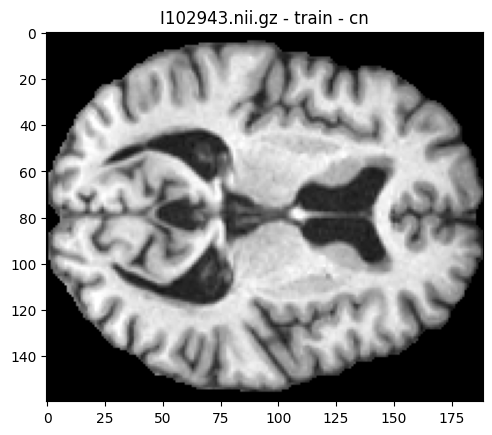

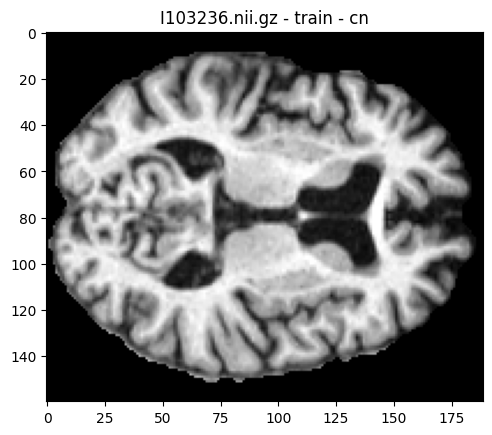

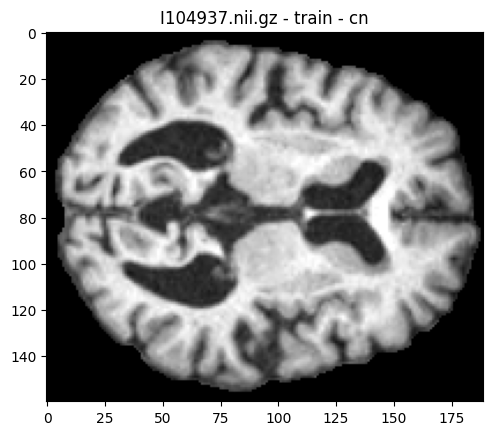

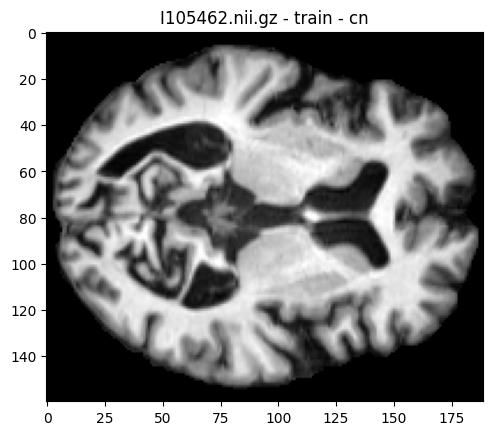

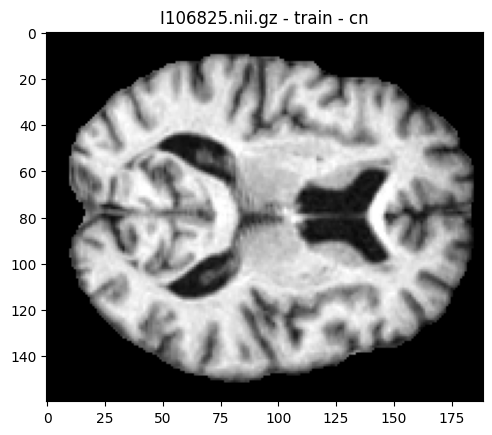

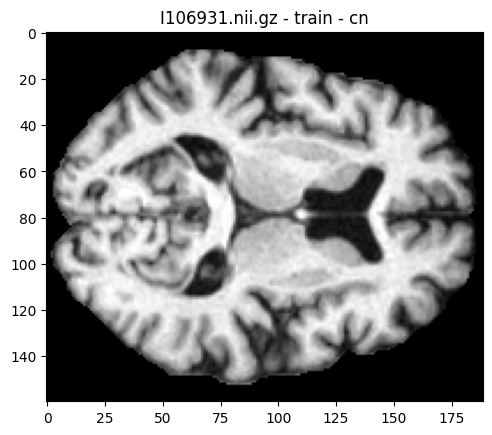

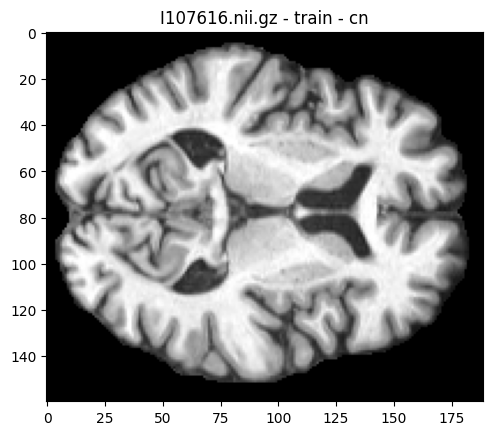

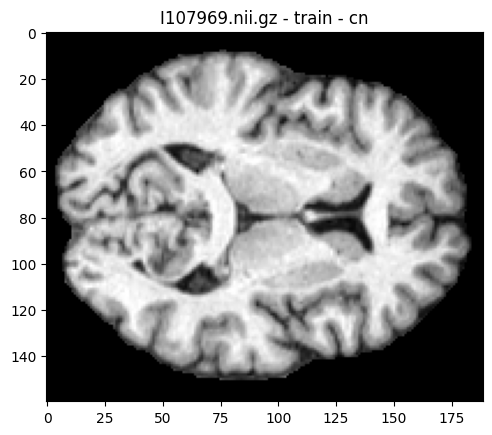

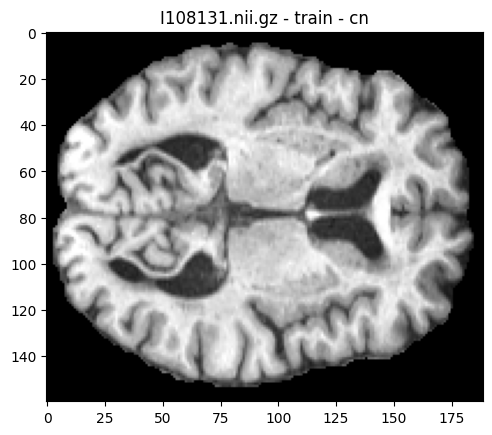

salvando no diretório train/emci


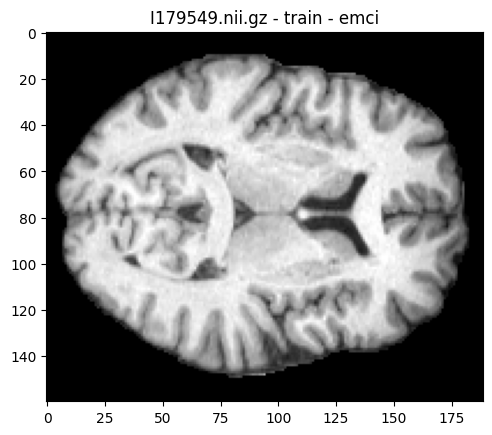

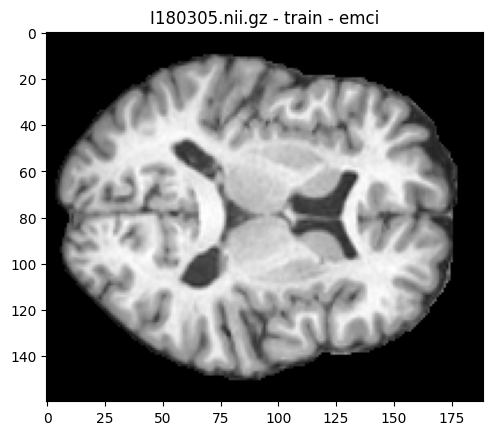

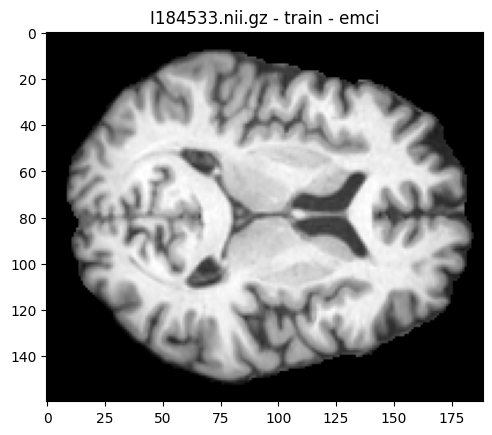

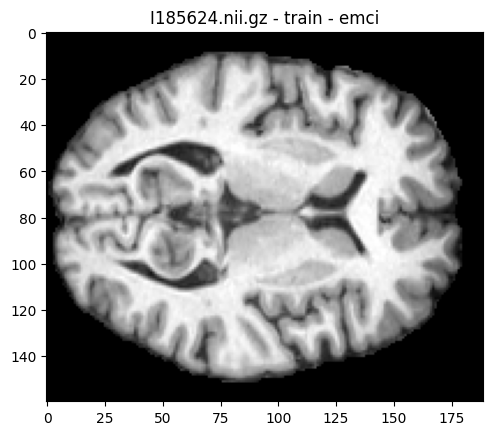

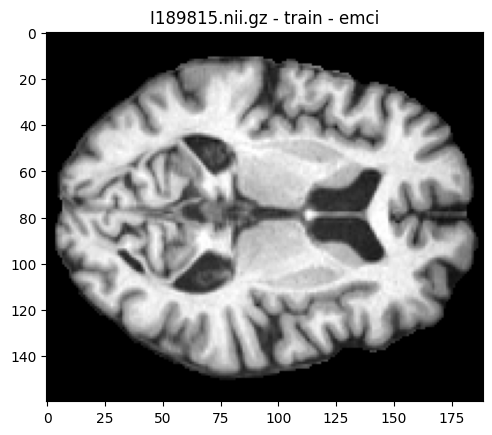

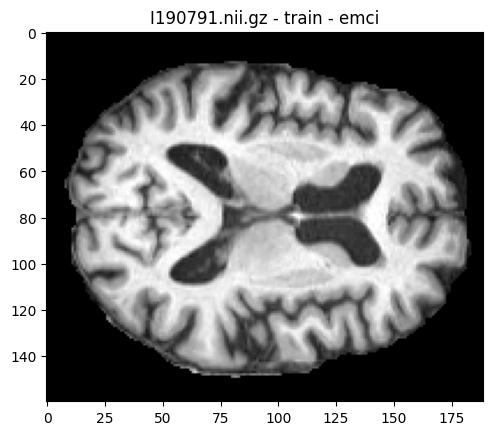

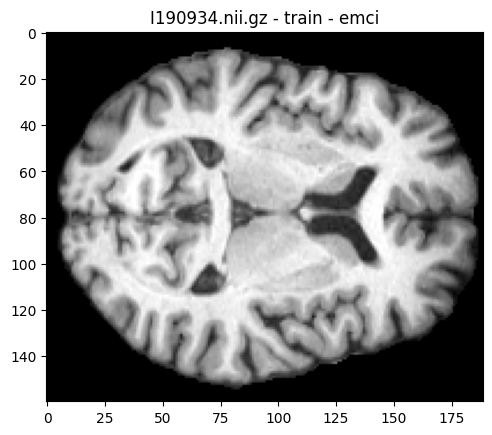

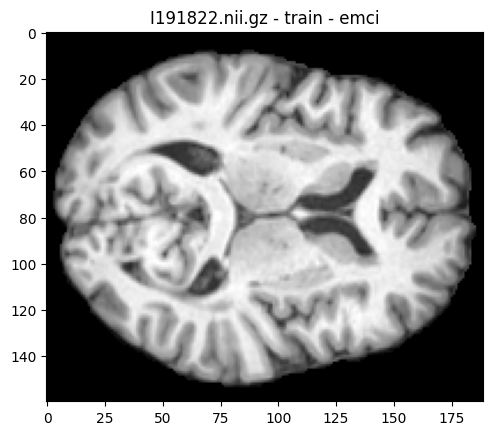

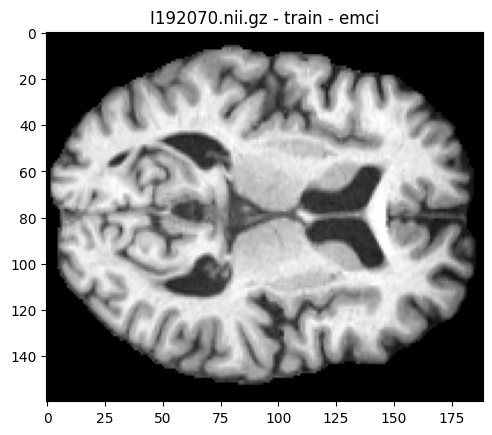

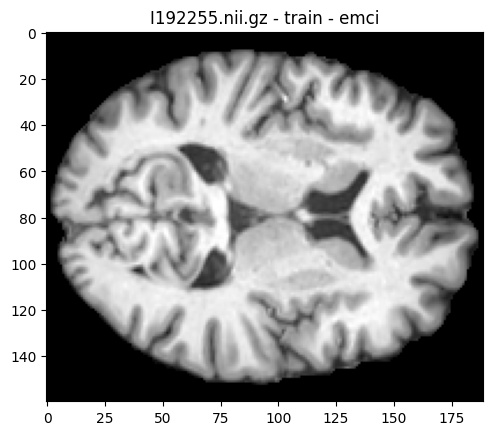

salvando no diretório train/mci


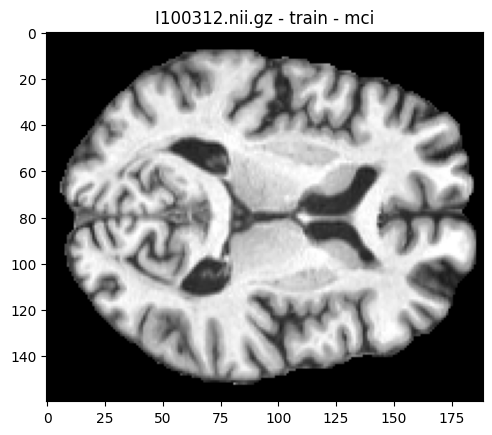

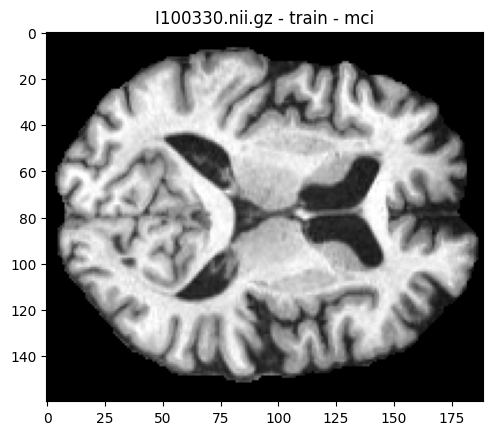

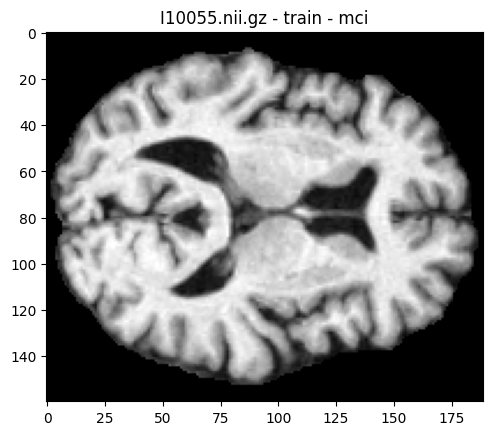

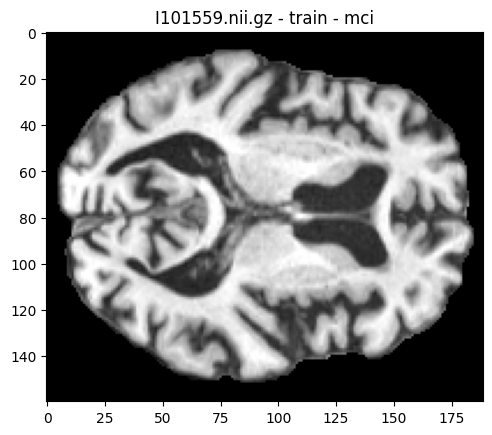

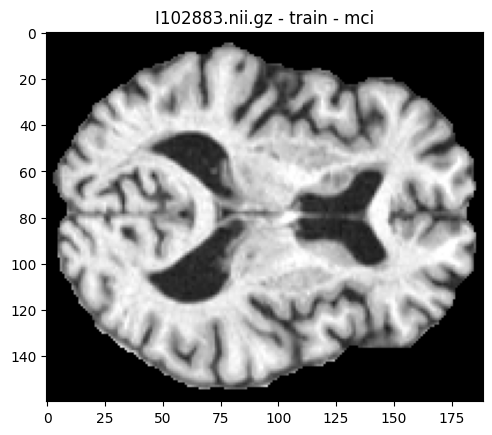

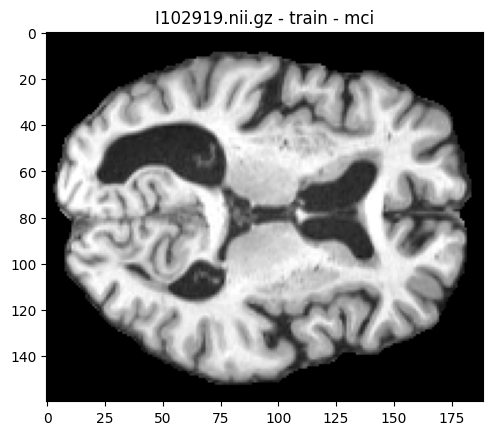

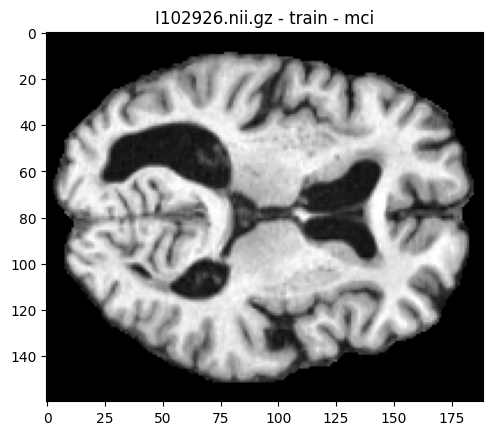

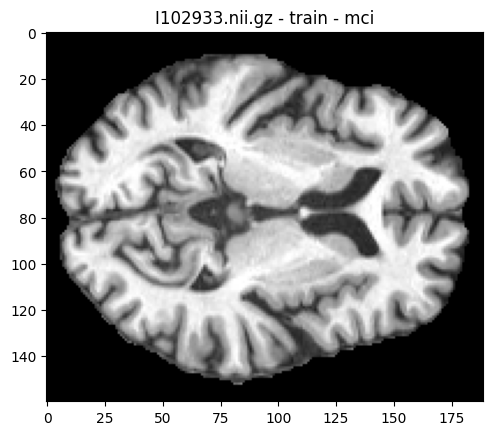

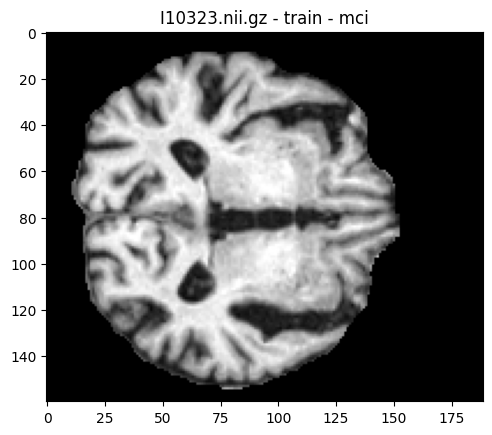

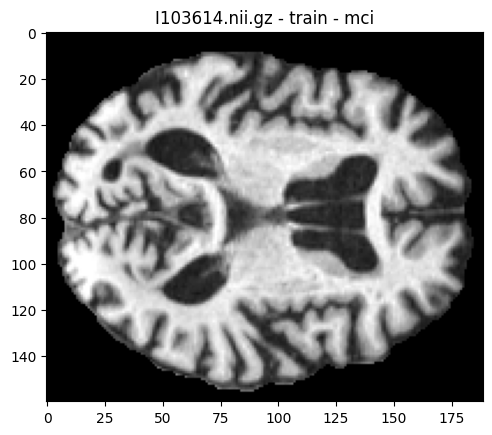

salvando no diretório train/lmci


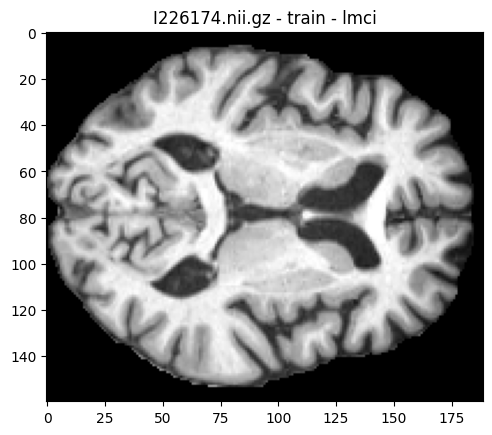

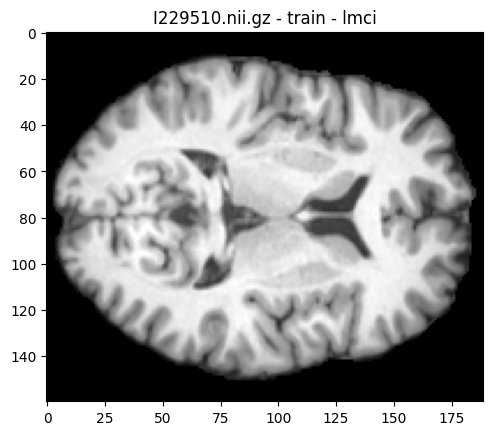

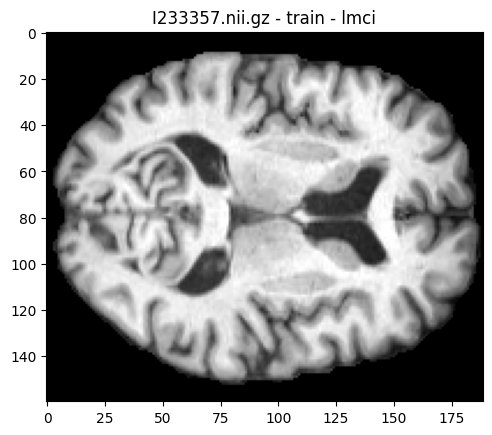

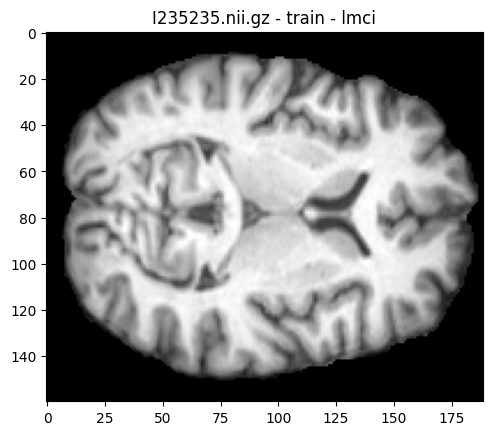

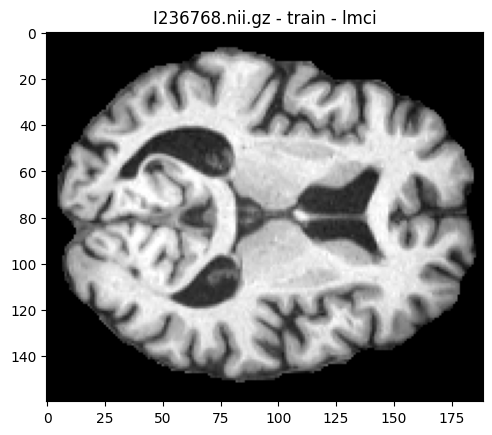

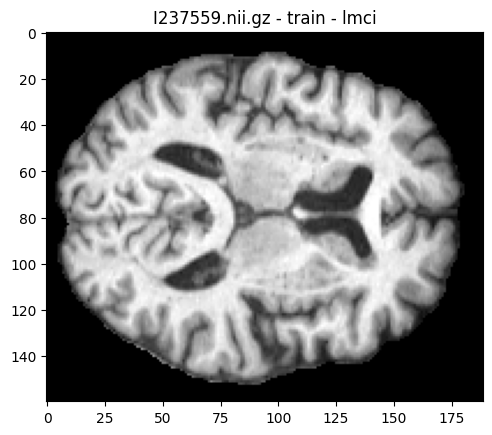

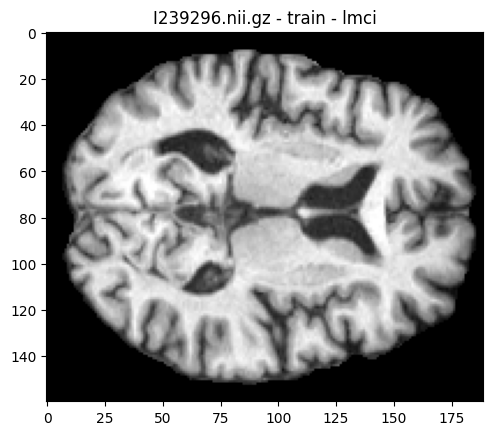

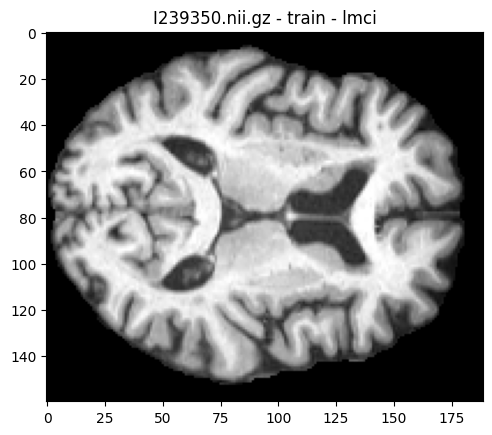

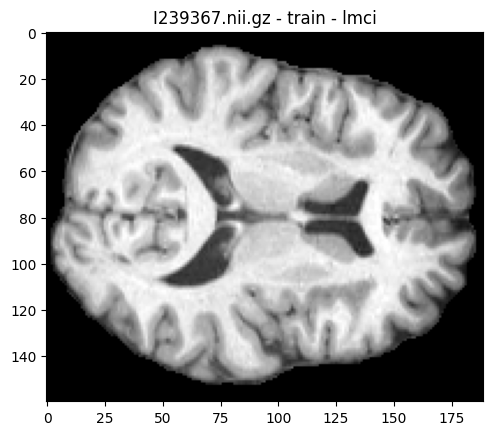

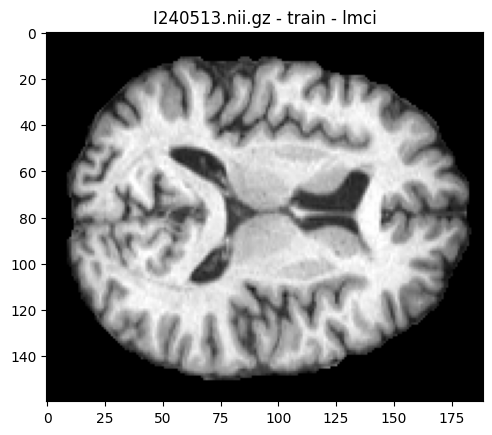

salvando no diretório train/ad


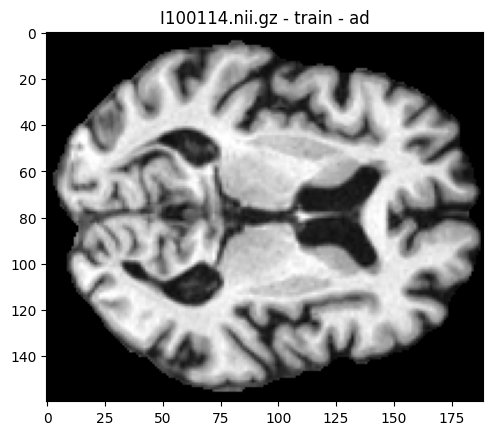

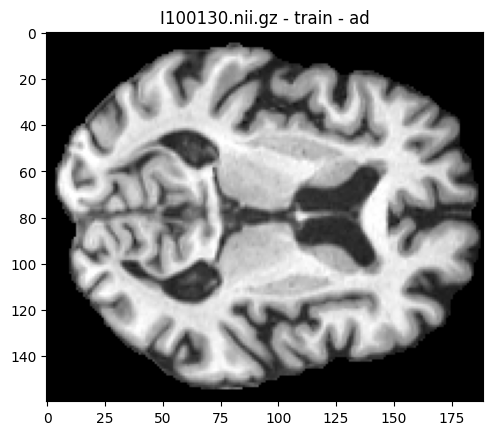

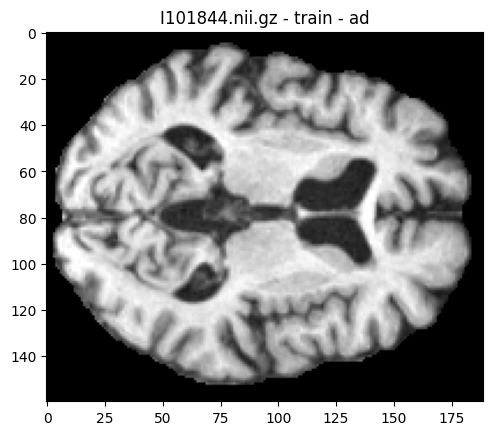

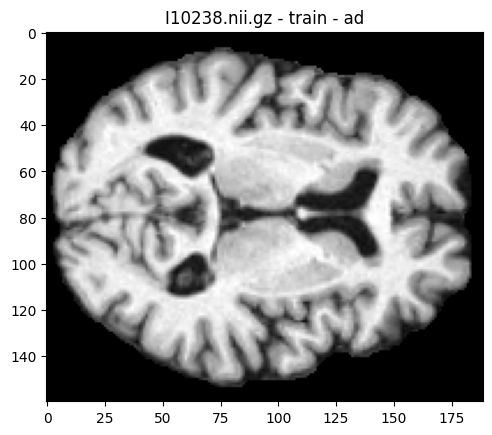

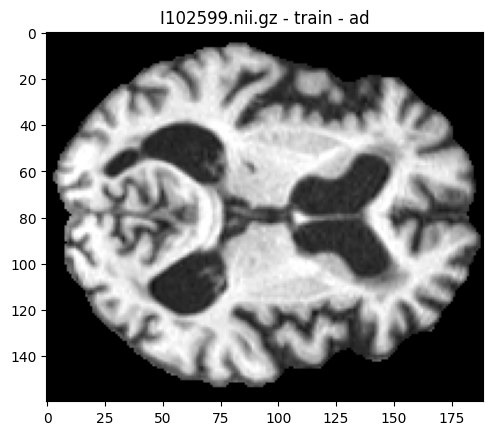

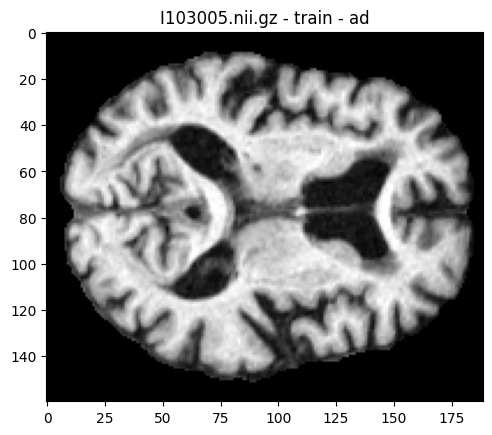

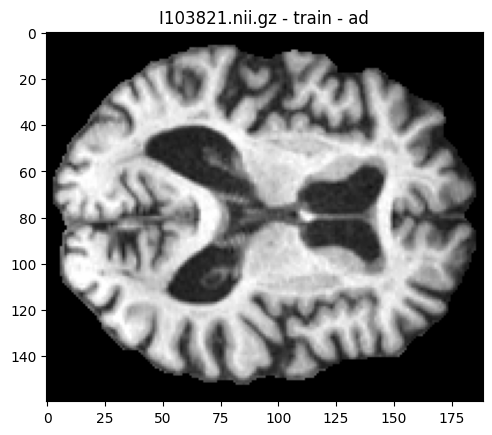

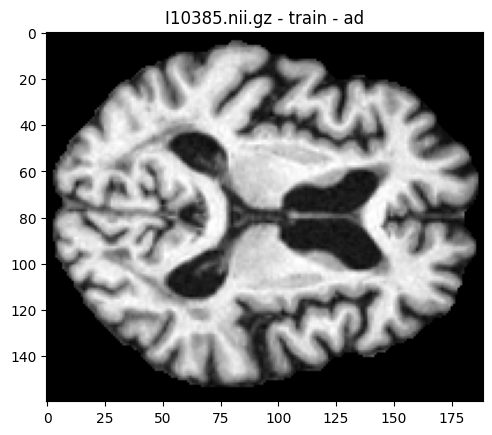

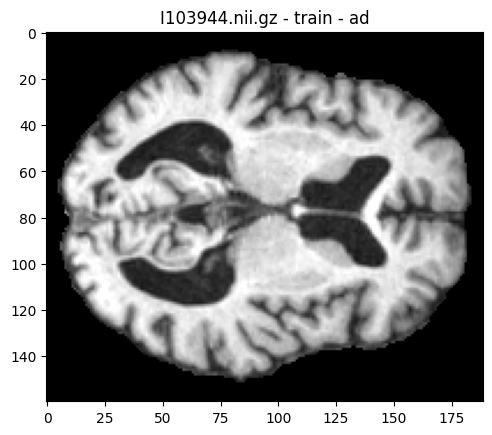

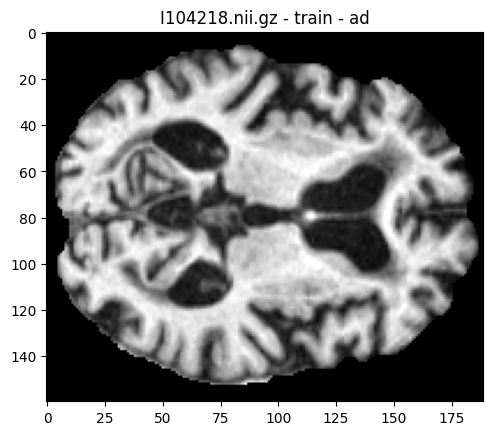

salvando no diretório validation/cn


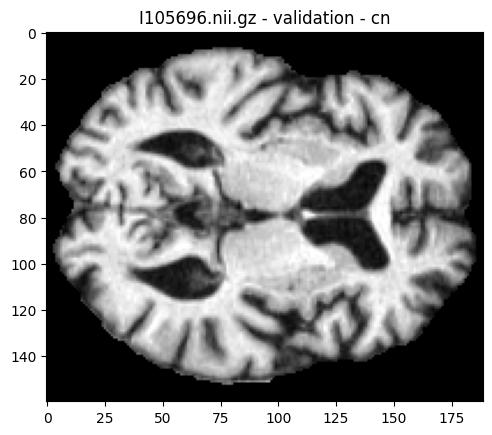

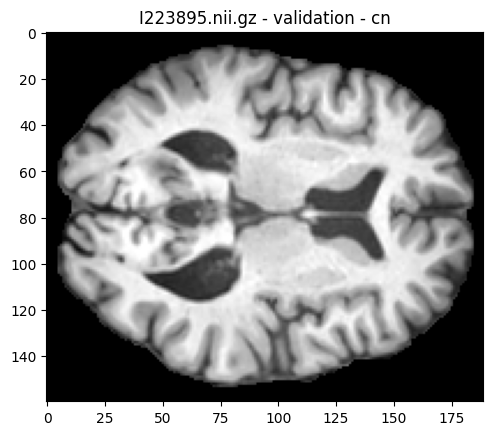

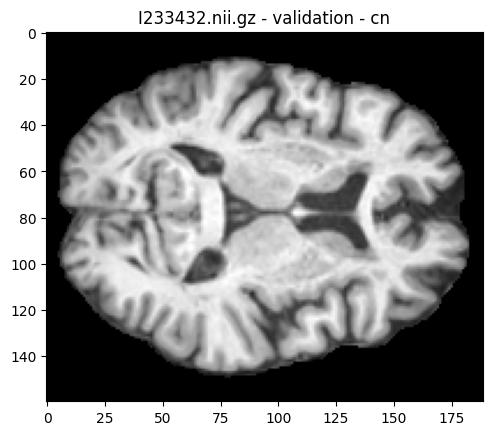

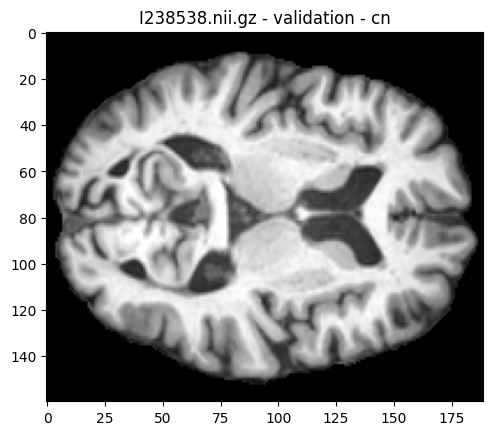

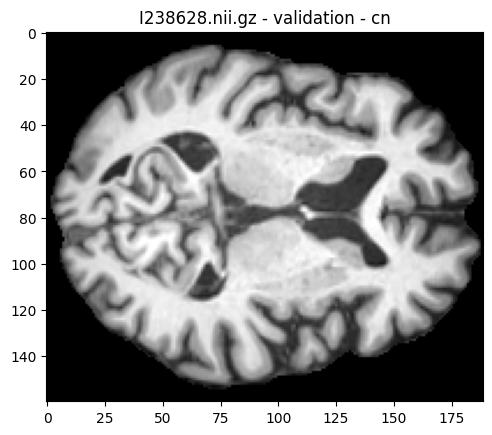

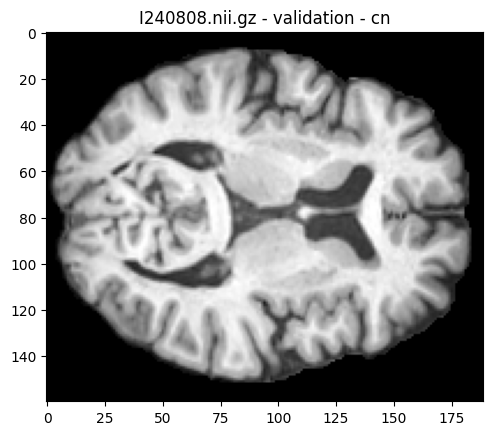

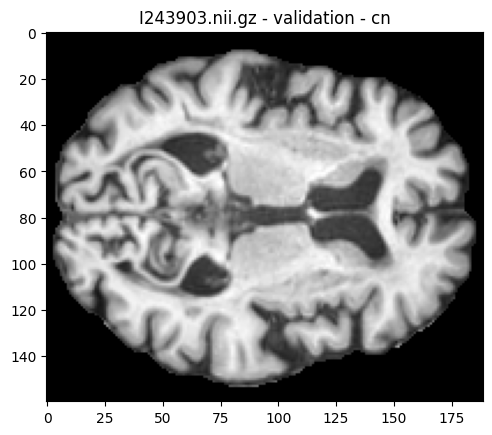

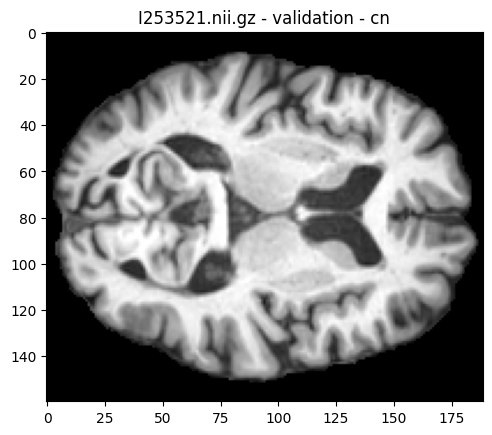

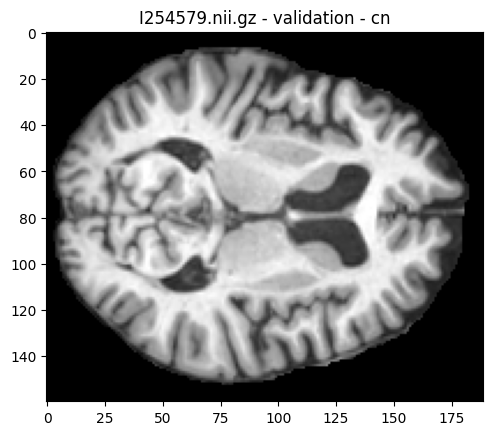

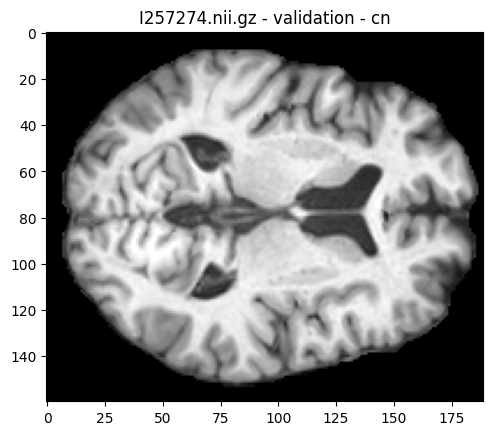

salvando no diretório validation/emci


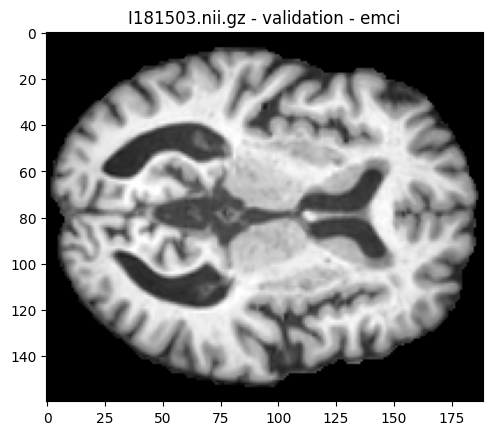

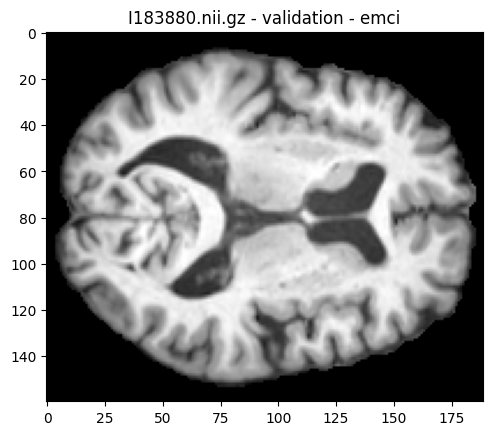

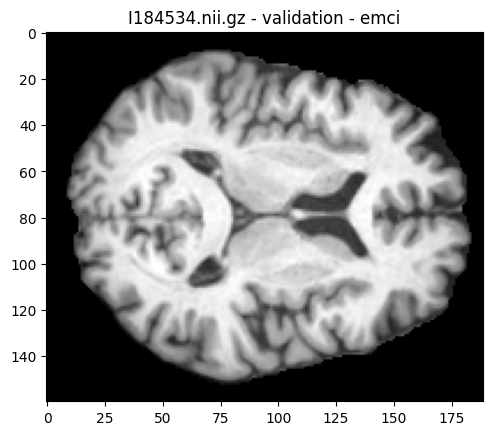

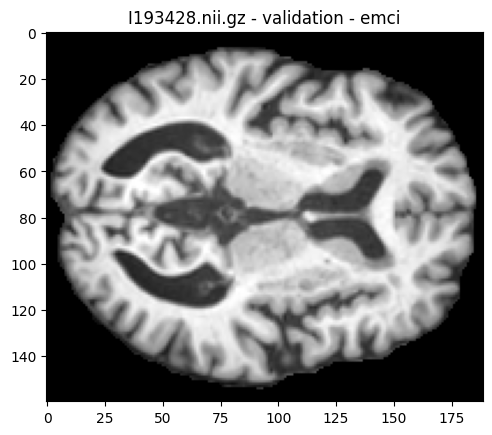

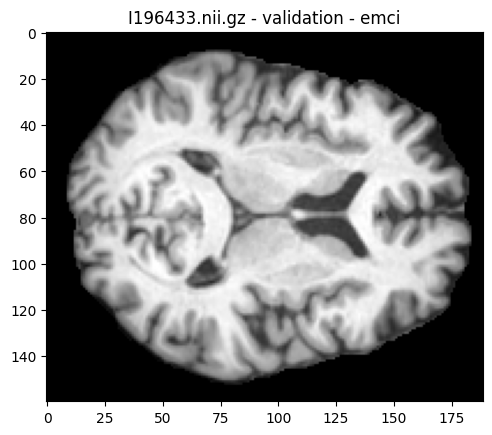

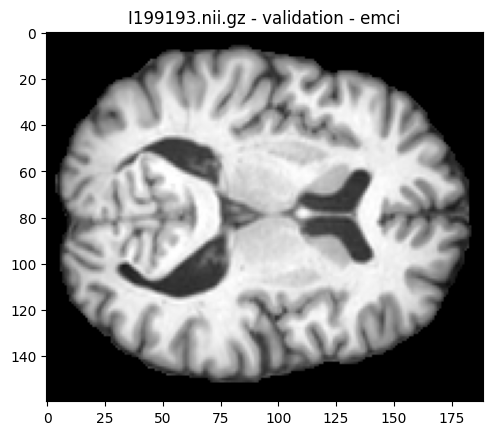

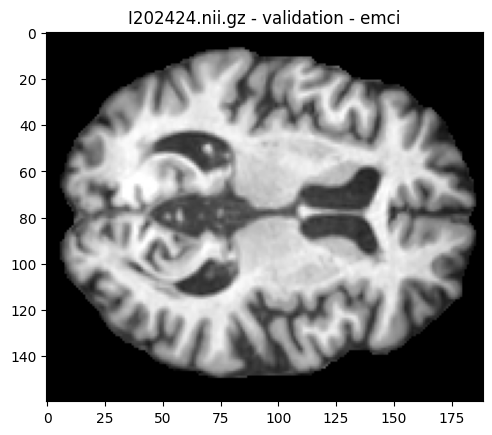

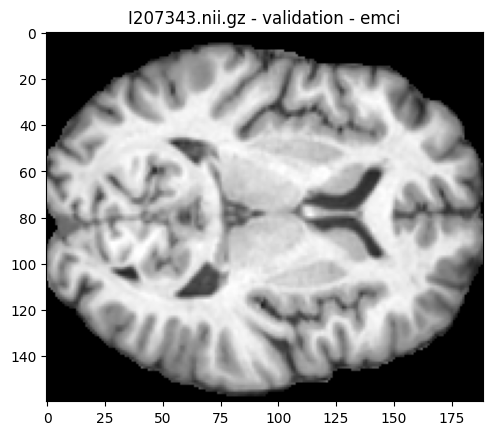

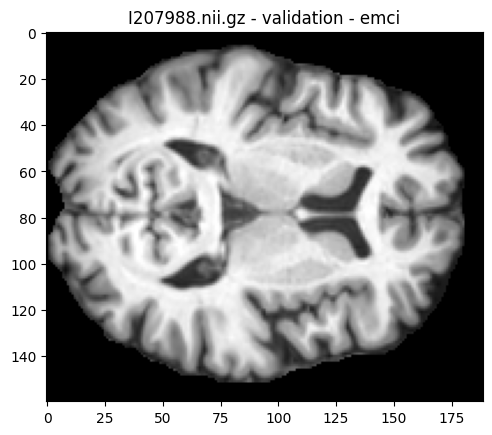

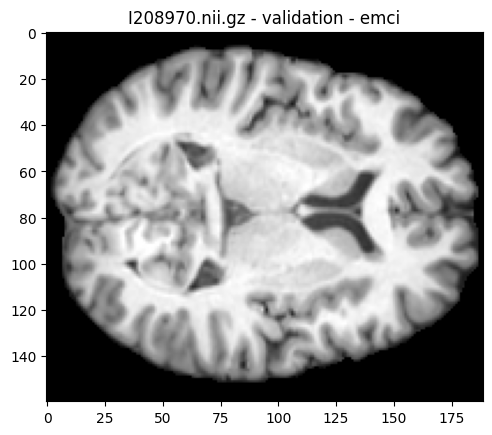

salvando no diretório validation/mci


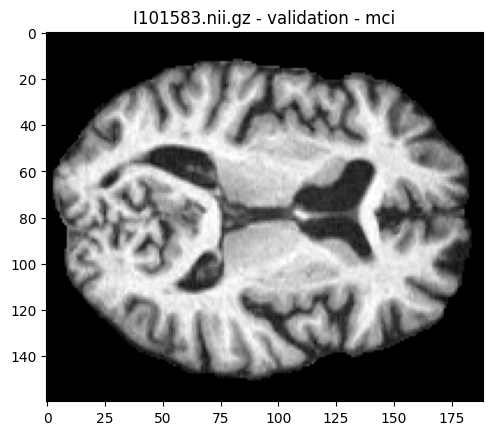

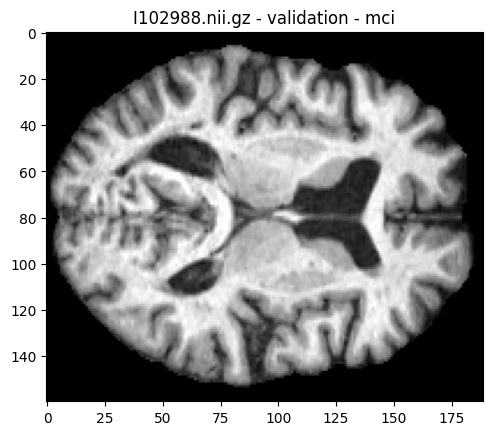

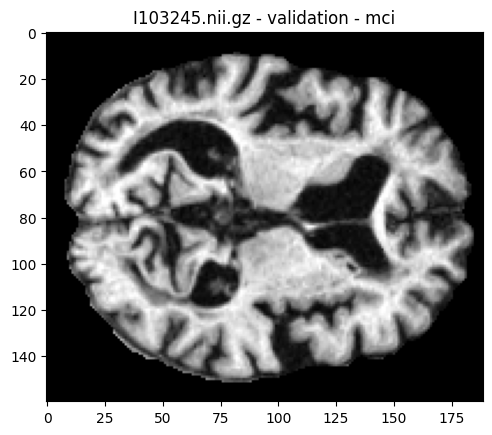

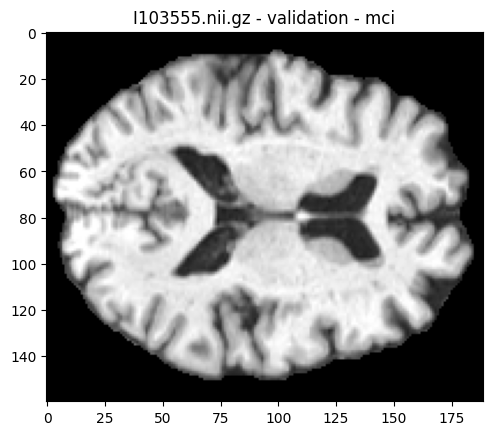

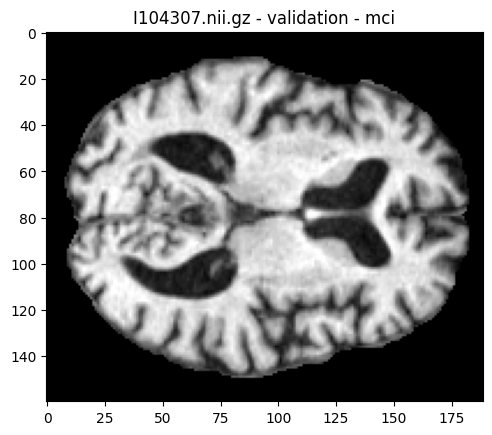

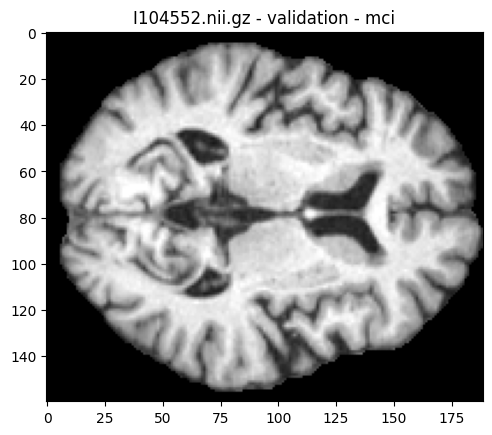

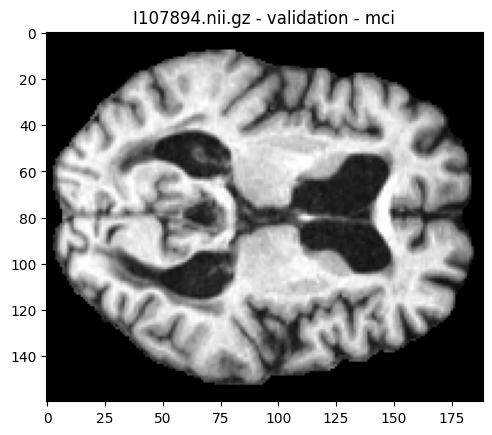

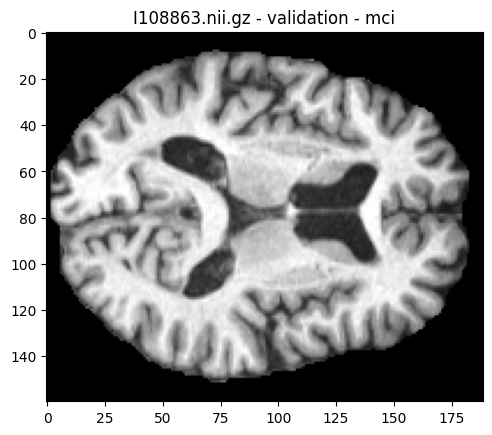

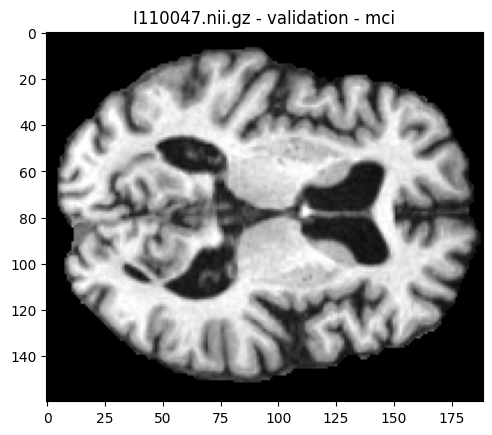

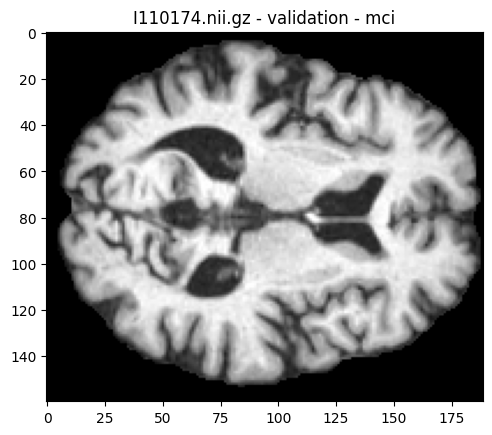

salvando no diretório validation/lmci


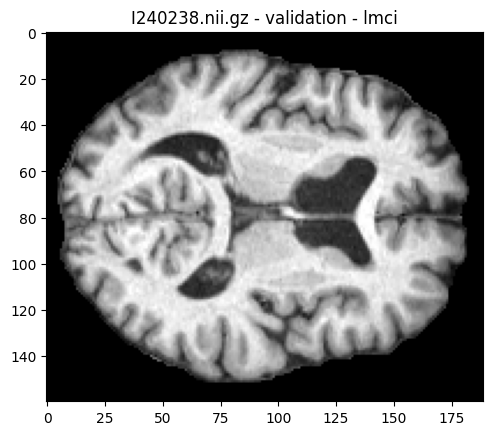

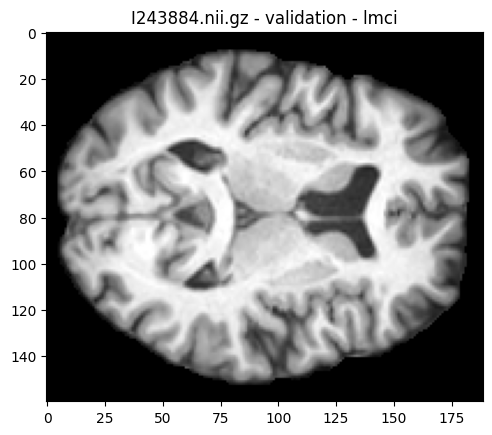

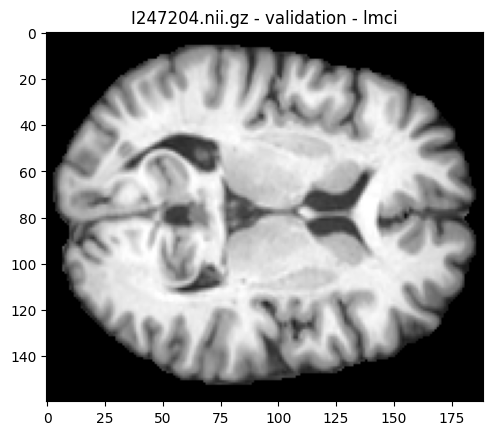

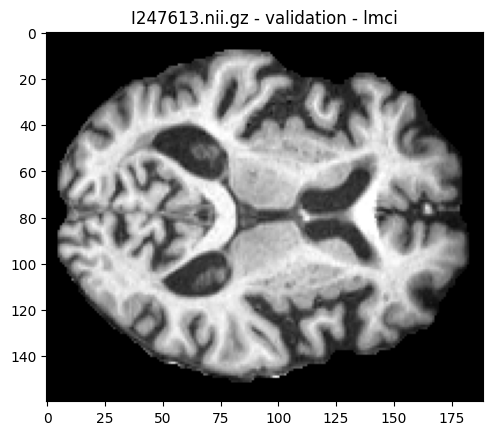

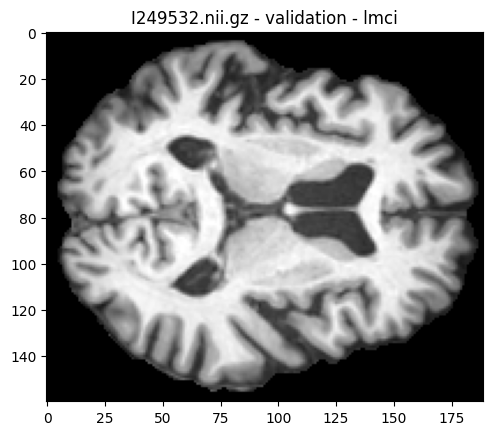

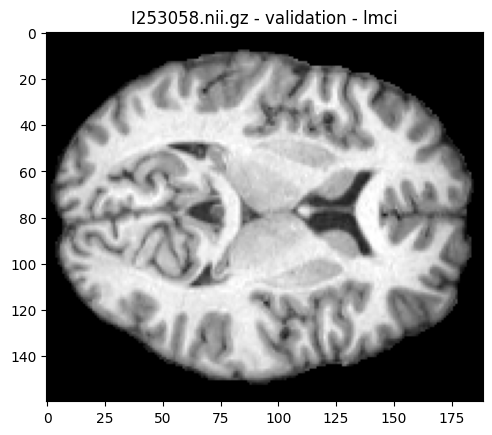

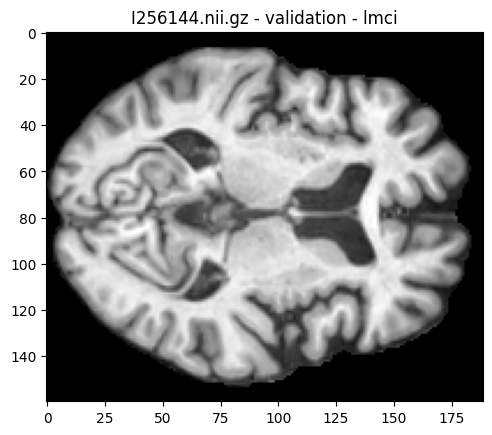

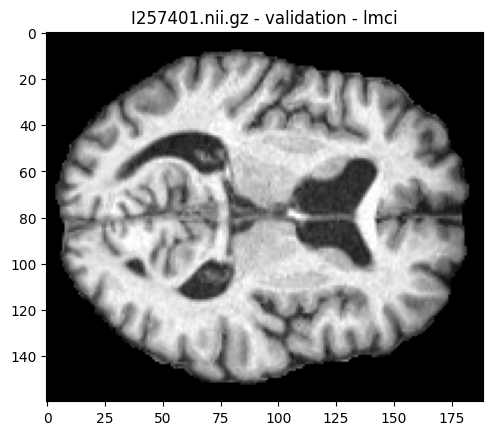

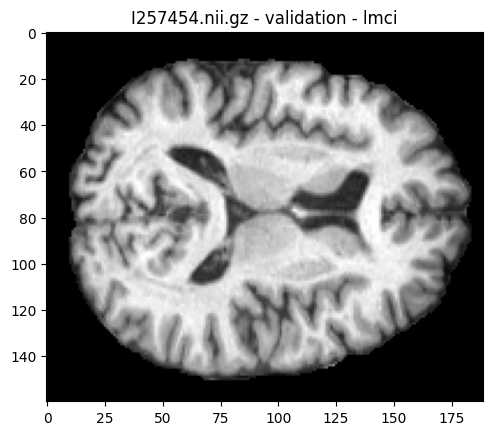

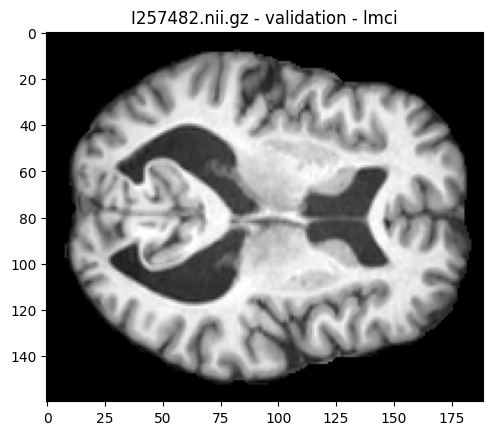

salvando no diretório validation/ad


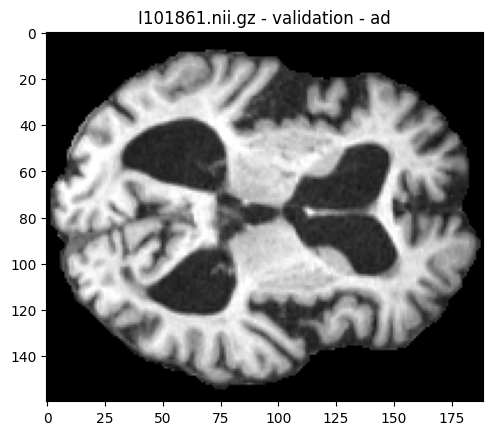

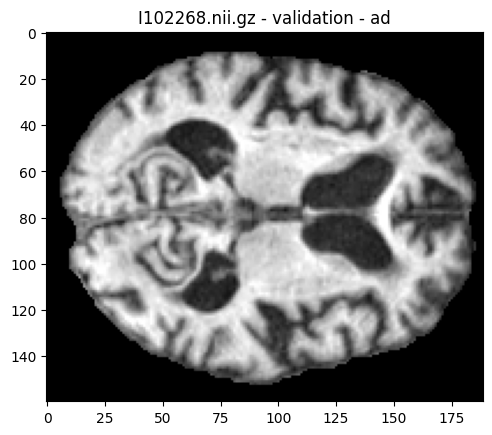

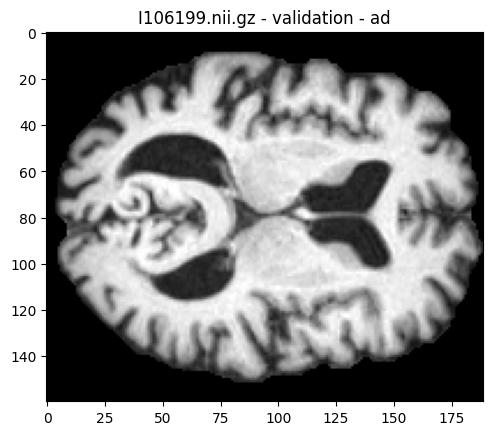

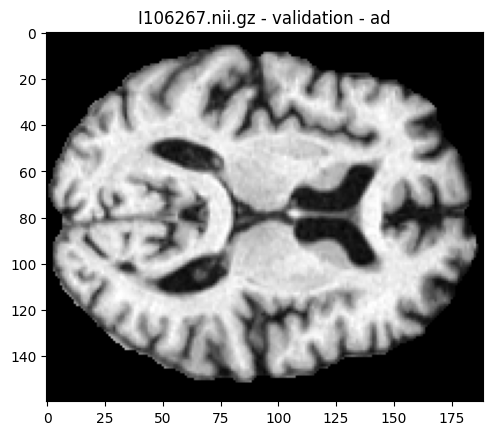

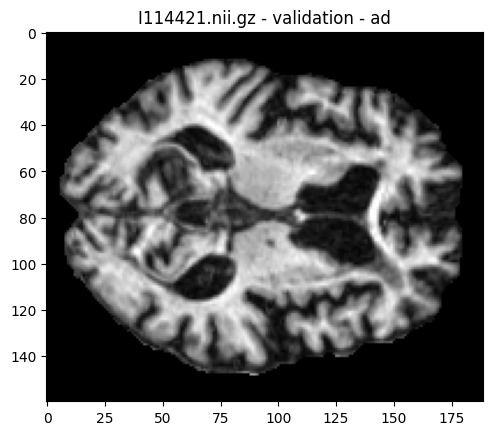

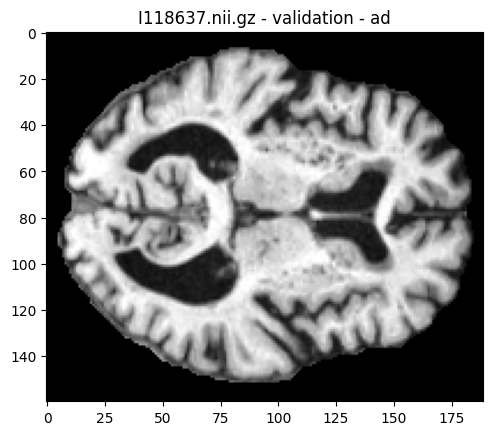

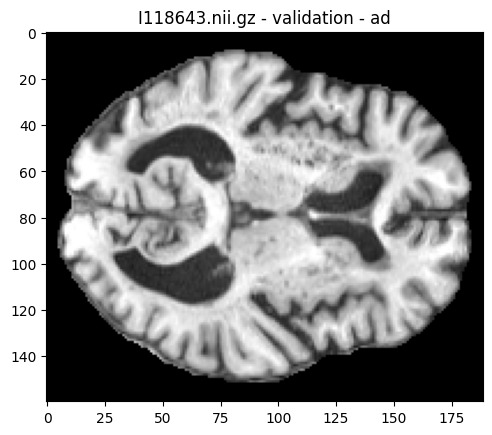

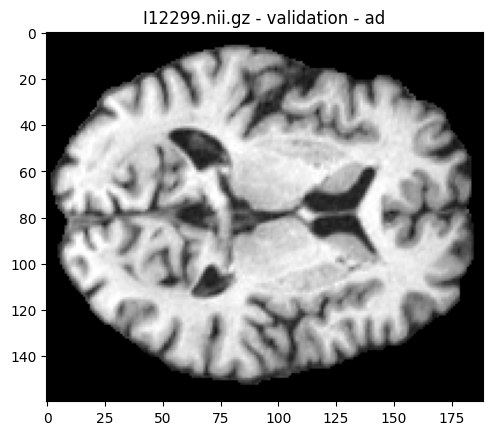

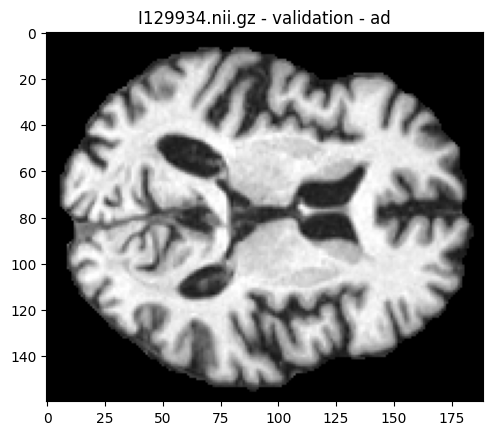

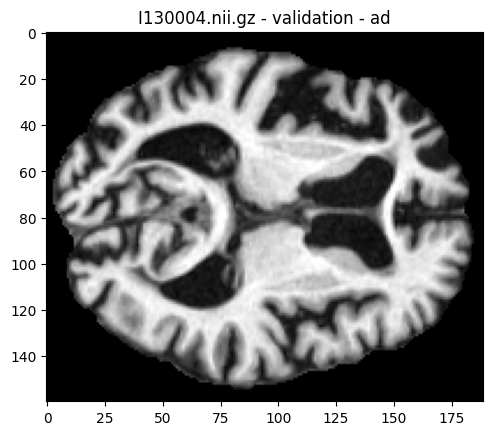

salvando no diretório test/cn


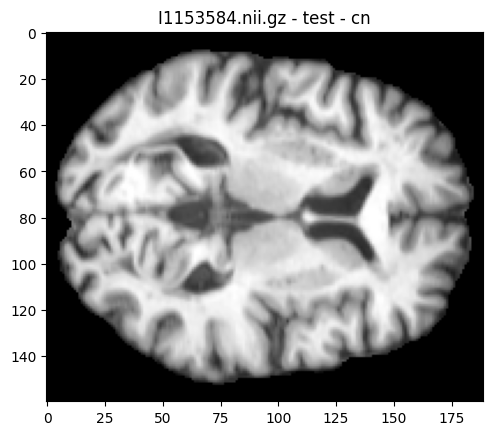

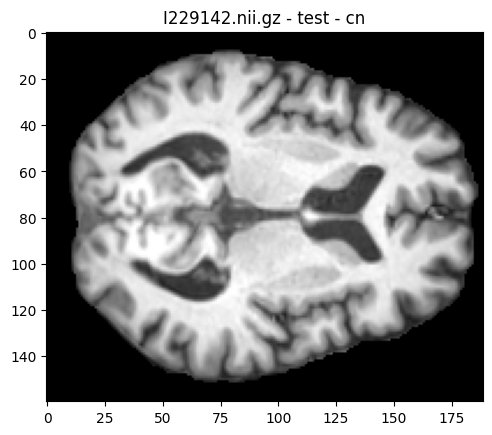

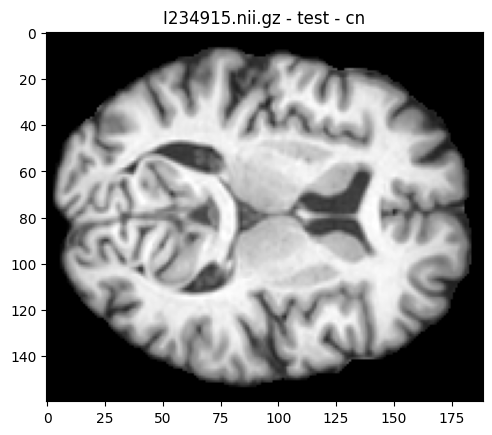

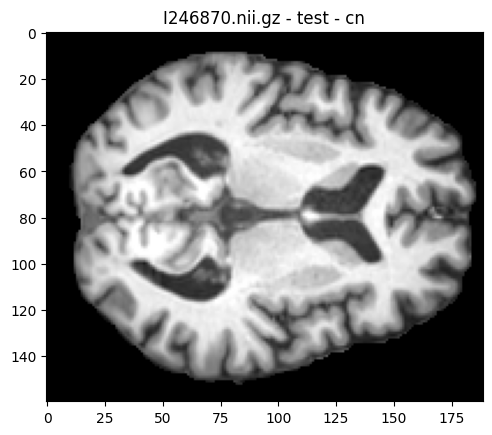

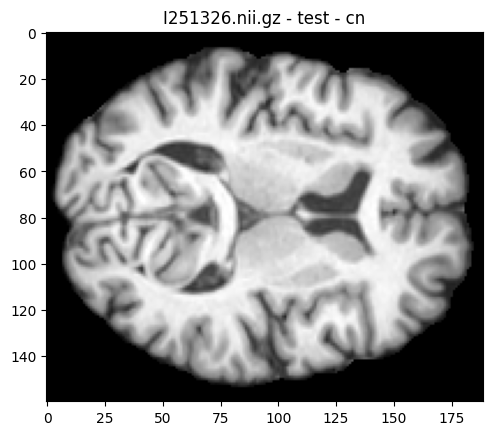

KeyboardInterrupt: 

In [59]:
subset = ['train', 'validation', 'test']
labels = ['cn', 'emci', 'mci', 'lmci', 'ad']

base_dir = "/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/NIFTI_PROCESSED"

for sub in subset:
    dir_sub = f"{base_dir}/{sub}"

    for label in labels:
        count = 0
        dir = f"{dir_sub}/{label}"
        names_to_plot = os.listdir(dir)

        print(f"salvando no diretório {sub}/{label}")

        for item in names_to_plot:
            if count < 10:
                file_path = f"{dir}/{item}"
                img_plot = nib.load(file_path).get_fdata()
                plt.imshow(img_plot[:, :, 80], cmap='gray')
                plt.title(f"{item} - {sub} - {label}")
                plt.show()
                count += 1

##### REMOVER ITENS

In [ ]:
subset = ['train', 'validation', 'test']
labels = ['cn', 'emci', 'mci', 'lmci', 'ad']

to_remove = [
    "I157584.nii.gz", "I32713.nii.gz", "I54534.nii.gz", "I56338.nii.gz", "I82191.nii.gz",
    "I190791.nii.gz", "I257210.nii.gz", "I291147.nii.gz", "I391660.nii.gz", "I391657.nii.gz",
    "I10323.nii.gz", "I227807.nii.gz", "I363775.nii.gz", "I400077.nii.gz", "I42957.nii.gz",
    "I399263.nii.gz", "I37523.nii.gz", "I435789.nii.gz", "I55156.nii.gz", "I88822.nii.gz",
    "I379681.nii.gz"
]


base_dir = "/mnt/c/Users/Team Taiane/Desktop/ADNI/FULL_ADNI/processed_2d_data/2D_axial_dataset"

for sub in subset:
    dir_sub = f"{base_dir}/{sub}"
    for label in labels:
        dir = f"{dir_sub}/{label}"
        dir_names = os.listdir(dir)
        print(len(dir_names))
        for item in to_remove:
            if item in dir_names:
                print(f"removendo arquivo: {item}")
                item_path = f"{dir}/{item}"
                os.remove(item_path)
        dir_names = os.listdir(dir)
        print(len(dir_names))

In [ ]:
subset = ['train', 'validation', 'test']
labels = ['cn', 'emci', 'mci', 'lmci', 'ad']



base_dir = "/mnt/c/Users/Team Taiane/Desktop/ADNI/FULL_ADNI/processed_2d_data/2D_axial_dataset"

for sub in subset:
    dir_sub = f"{base_dir}/{sub}"
    for label in labels:
        dir = f"{dir_sub}/{label}"
        dir_names = os.listdir(dir)
        print(f"n de {sub} da classe {label}: {len(dir_names)}")


##### CHECAR MODELO

In [ ]:
from tensorflow.keras.models import load_model

model_path = "C:/Users/Paulo Pires/Desktop/Alzheimer_cnn/7_slices_sagital/results/test_1/binary_classifier_150_epochs_batch_64_2_classes.keras"
model = load_model(model_path)
model.summary()

##### NORMALIZAR DADOS

In [ ]:
import os
import ants
import numpy as np
import matplotlib.pyplot as plt
from concurrent.futures import ThreadPoolExecutor

# Normalization -> valores de voxels entre 0 e 1
def normalize_image_min(image_data): 
    min_val = np.min(image_data)
    max_val = np.max(image_data)
    normalized_data = (image_data - min_val) / (max_val - min_val)
    return normalized_data

def normalize_img(input_folder, output_folder, item):
    input_path = os.path.join(input_folder, item)
    #print(f"IMAGEM {input_path} SENDO REDIMENSIONADA.")
    output_path = os.path.join(output_folder, item)

    img_3d = ants.image_read(input_path)
    data_3d = img_3d.numpy()
        
    data_3d = normalize_image_min(data_3d)
    img_3d = ants.from_numpy(data_3d)
    
    ants.image_write(img_3d, output_path)
    print(f"IMAGEM SALVA EM {output_path}\n")


# DIR_BASE = "/mnt/c/Users/Team Taiane/Desktop/ADNI/FULL_ADNI/raw_data/3D_BRAIN_NOT_NORMALIZED"
# DIR_NORMALIZED = "/mnt/c/Users/Team Taiane/Desktop/ADNI/FULL_ADNI/3D_NORM"

DIR_BASE = "/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/3D_BRAIN_NOT_NORMALIZED"
DIR_NORMALIZED = "/mnt/c/Users/Paulo Pires/Desktop/Alzheimer_cnn/3D_BRAIN_NORM"


os.makedirs(DIR_NORMALIZED, exist_ok=True)

for subfolder in ['train', 'validation', 'test']:
    if subfolder in os.listdir(DIR_BASE):   
        print(f"\n\nDIRECTORY: {subfolder}\n\n")
        input_dir = os.path.join(DIR_BASE, subfolder)
        output_dir = os.path.join(DIR_NORMALIZED, subfolder)
        os.makedirs(output_dir, exist_ok=True)

        for group in ['cn', 'emci', 'mci', 'lmci', 'ad']:
            if group in os.listdir(input_dir):
                print(f"GROUP: {group}\n\n")
                input_folder = os.path.join(input_dir, group)            
                output_folder = os.path.join(output_dir, group)       
                os.makedirs(output_folder, exist_ok=True)

                already_processed = [file for file in os.listdir(output_folder)] # checa se alguma já foi processada
                image_paths = [file for file in os.listdir(input_folder) if file not in already_processed] # carrega as imagens não processadas

                with ThreadPoolExecutor(max_workers=128) as executor:
                    futures = [executor.submit(normalize_img, input_folder, output_folder, item) for item in image_paths]

                    # Aguarda todas as tarefas terminarem
                    for future in futures:
                        future.result()

##### REDUZIR TAMANHO

In [ ]:
import os
import nibabel as nib
import numpy as np
from scipy.ndimage import zoom
from concurrent.futures import ThreadPoolExecutor

def normalize_image_min(image_data): 
    min_val = np.min(image_data)
    max_val = np.max(image_data)
    normalized_data = (image_data - min_val) / (max_val - min_val)
    return normalized_data

# Diretórios de entrada e saída
DIR_BASE = "/mnt/c/Users/Team Taiane/Desktop/ADNI/FULL_ADNI/raw_data/3D_BRAIN_NOT_NORMALIZED"
DIR_REDUCED = "/mnt/c/Users/Team Taiane/Desktop/ADNI/FULL_ADNI/3D_REDUCED"
os.makedirs(DIR_REDUCED, exist_ok=True)

# Parâmetros de redução
scale_factors = (0.5, 0.5, 0.5)  # Redução pela metade
interpolation_order = 3  # Ordem da interpolação (bicúbico para equilíbrio entre suavidade e preservação de detalhes)

# Função para processar uma única imagem
def process_and_save_nifti(input_folder, output_folder, filename):
    input_path = os.path.join(input_folder, filename)
    output_path = os.path.join(output_folder, filename)

    try:
        # Carregar a imagem NIfTI
        nii = nib.load(input_path)
        image_data = nii.get_fdata()

        # Reduzir a resolução da imagem
        reduced_data = zoom(image_data, scale_factors, order=interpolation_order, mode='nearest')
        
        reduced_data = normalize_image_min(reduced_data)

        # Criar uma nova imagem NIfTI com os metadados originais
        reduced_nii = nib.Nifti1Image(reduced_data, affine=nii.affine, header=nii.header)

        # Salvar a nova imagem
        nib.save(reduced_nii, output_path)

        print(f"Processado e salvo: {output_path}")
    except Exception as e:
        print(f"Erro ao processar {filename}: {e}")

# Processar imagens em paralelo
for subfolder in ['train', 'validation', 'test']:
    print(f"\n\nPROCESSANDO DIRETÓRIO: {subfolder}\n\n")
    input_dir = os.path.join(DIR_BASE, subfolder)
    output_dir = os.path.join(DIR_REDUCED, subfolder)
    os.makedirs(output_dir, exist_ok=True)

    for group in ['cn', 'emci', 'mci', 'lmci', 'ad']:
        print(f"PROCESSANDO GRUPO: {group}\n")
        input_folder = os.path.join(input_dir, group)            
        output_folder = os.path.join(output_dir, group)       
        os.makedirs(output_folder, exist_ok=True)

        already_processed = set(os.listdir(output_folder))  # Verifica quais já foram processadas
        image_paths = [file for file in os.listdir(input_folder) if file not in already_processed]  # Filtra as não processadas

        # Paralelizar processamento
        with ThreadPoolExecutor(max_workers=48) as executor:
            futures = [executor.submit(process_and_save_nifti, input_folder, output_folder, img) for img in image_paths]

            # Aguarda todas as tarefas finalizarem
            for future in futures:
                future.result()

In [ ]:
import matplotlib.pyplot as plt

path = "/mnt/c/Users/Team Taiane/Desktop/ADNI/FULL_ADNI/3D_NORM/test/ad/"
for item in os.listdir(path):
    img = nib.load(f"{path}/{item}").get_fdata()
    print(np.min(img))

In [ ]:
import pydicom

path = '122760_1.DCM'

test = pydicom.dcmread(path)

print(test)